 Project 4: Web Scraping Job Postings
Business Case Overview
You're working as a data scientist for a contracting firm that's rapidly expanding. Now that they have their most valuable employee (you!), they need to leverage data to win more contracts. Your firm offers technology and scientific solutions and wants to be competitive in the hiring market. Your principal has two main objectives:

Determine the industry factors that are most important in predicting the salary amounts for these data.
Determine the factors that distinguish job categories and titles from each other. For example, can required skills accurately predict job title?
To limit the scope, your principal has suggested that you focus on data-related job postings, e.g. data scientist, data analyst, research scientist, business intelligence, and any others you might think of. You may also want to decrease the scope by limiting your search to a single region.

Hint: Aggregators like Indeed.com regularly pool job postings from a variety of markets and industries.

Goal: Scrape your own data from a job aggregation tool like Indeed.com in order to collect the data to best answer these two questions.

Directions
In this project you will be leveraging a variety of skills. The first will be to use the web-scraping and/or API techniques you've learned to collect data on data jobs from Indeed.com or another aggregator. Once you have collected and cleaned the data, you will use it to answer the two questions described above.

QUESTION 1: Factors that impact salary
To predict salary you will be building either a classification or regression model, using features like the location, title, and summary of the job. If framing this as a regression problem, you will be estimating the listed salary amounts. You may instead choose to frame this as a classification problem, in which case you will create labels from these salaries (high vs. low salary, for example) according to thresholds (such as median salary).

You have learned a variety of new skills and models that may be useful for this problem:

NLP
Unsupervised learning and dimensionality reduction techniques (PCA, clustering)
Ensemble methods and decision tree models
SVM models
Whatever you decide to use, the most important thing is to justify your choices and interpret your results. Communication of your process is key. Note that most listings DO NOT come with salary information. You'll need to able to extrapolate or predict the expected salaries for these listings.

QUESTION 2: Factors that distinguish job category
Using the job postings you scraped for part 1 (or potentially new job postings from a second round of scraping), identify features in the data related to job postings that can distinguish job titles from each other. There are a variety of interesting ways you can frame the target variable, for example:

What components of a job posting distinguish data scientists from other data jobs?
What features are important for distinguishing junior vs. senior positions?
Do the requirements for titles vary significantly with industry (e.g. healthcare vs. government)?
You may end up making multiple classification models to tackle different questions. Be sure to clearly explain your hypotheses and framing, any feature engineering, and what your target variables are. The type of classification model you choose is up to you. Be sure to interpret your results and evaluate your models' performance.

BONUS PROBLEM
Your boss would rather tell a client incorrectly that they would get a lower salary job than tell a client incorrectly that they would get a high salary job. Adjust one of your models to ease his mind, and explain what it is doing and any tradeoffs. Plot the ROC curve.

Requirements
Scrape and prepare your own data.

Create and compare at least two models for each section. One of the two models should be a decision tree or ensemble model. The other can be a classifier or regression of your choosing (e.g. Ridge, logistic regression, KNN, SVM, etc).

Section 1: Job Salary Trends
Section 2: Job Category Factors
Prepare a polished Jupyter Notebook with your analysis for a peer audience of data scientists.

Make sure to clearly describe and label each section.
Comment on your code so that others could, in theory, replicate your work.
A brief writeup in an executive summary, written for a non-technical audience.

Writeups should be at least 500-1000 words, defining any technical terms, explaining your approach, as well as any risks and limitations.
BONUS
Answer the salary discussion by using your model to explain the tradeoffs between detecting high vs low salary positions.

Convert your executive summary into a public blog post of at least 500 words, in which you document your approach in a tutorial for other aspiring data scientists. Link to this in your notebook.

Suggestions for Getting Started
Collect data from Indeed.com (or another aggregator) on data-related jobs to use in predicting salary trends for your analysis.
Select and parse data from at least 1000 postings for jobs, potentially from multiple location searches.
Find out what factors most directly impact salaries (e.g. title, location, department, etc).
Test, validate, and describe your models. What factors predict salary category? How do your models perform?
Discover which features have the greatest importance when determining a low vs. high paying job.
Your Boss is interested in what overall features hold the greatest significance.
HR is interested in which SKILLS and KEY WORDS hold the greatest significance.
Author an executive summary that details the highlights of your analysis for a non-technical audience.
If tackling the bonus question, try framing the salary problem as a classification problem detecting low vs. high salary positions.
Useful Resources
Scraping is one of the most fun, useful and interesting skills out there. Don’t lose out by copying someone else's code!
Here is some advice on how to write for a non-technical audience
Documentation for BeautifulSoup can be found here.
Project Feedback + Evaluation
For all projects, students will be evaluated on a simple 3 point scale (0, 1, or 2). Instructors will use this rubric when scoring student performance on each of the core project requirements:

Score	Expectations
0	Does not meet expectations. Try again.
1	Meets expectations. Good job.
2	Surpasses expectations. Brilliant!
For more information on how we grade our DSI projects, see our project grading walkthrough.

In [474]:
import csv
import requests 
import random
import re
from time import sleep
from bs4 import BeautifulSoup
job_name=[]
url_name=[] 
loc_name=[]
salary_range=[] 
recruiter_name=[] 
job_brief_desc=[]
total_list=[]
posting_num=[]
outcount=0
maxrecords=1500

In [2]:

# main serach page
# https://www.mendeley.com/careers/searchjobs/?Keywords=data+scientist&radialtown=United+States&LocationId=200&RadialLocation=20&NearFacetsShown=true
#     &CountryCode=

# page 2
# https://www.mendeley.com/careers/searchjobs/?LocationId=200&keywords=data+scientist&radiallocation=20&countrycode=US&Page=2

# page 3
# https://www.mendeley.com/careers/searchjobs/?LocationId=200&keywords=data+scientist&radiallocation=20&countrycode=US&Page=2


In [475]:
for i in range(2,100):      # Number of pages plus one 

    url='https://www.mendeley.com/careers/jobs/uk-sterling/{}/?keywords=data+scientist'.format(i)

#     print url
    r = requests.get(url)
    incount=0
    soup = BeautifulSoup(r.content,'lxml')
 
    Title = soup.find_all("div", {"class":"lister__details cf js-clickable"})
#     check if number of records exceeds maxcounter 
    if outcount<=maxrecords:    
        for j in Title:
            incount += 1
    #         print incount

            try:     
                job = j.find("h3", {"class":"lister__header"}).text.strip()
                job_name.append(job)
            except Exception:
                pass    

            try:
                url_ref=j.find('a', href=True)
                url='https://www.mendeley.com'+ url_ref['href'].strip()
                url_name.append(url)
                print url
    #             url_name.append('https://www.mendeley.com/'+ url_ref['href'])
            except Exception:
                pass    

            try:
                location = j.find("li", {"class":"lister__meta-item lister__meta-item--location"}).text.strip()
                loc_name.append(location)
            except Exception:
                pass  

            try:
                salary = j.find("li", {"class":"lister__meta-item lister__meta-item--salary"}).text.strip()
                salary_range.append(salary)
                print salary
            except Exception:
                pass
    

            try:
                recruiter = j.find("li", {"class":"lister__meta-item lister__meta-item--recruiter"}).text.strip()
                recruiter_name.append(recruiter)
            except Exception:
                pass 

            try:
                brief_desc = j.find("p", {"class":"lister__description js-clamp-2"}).text.strip()
                job_brief_desc.append(brief_desc)
            except Exception:
                pass
            

        outcount=outcount+incount


            
# print 'outcount=',outcount
print  'Done ....completed with total records found of:', outcount            


https://www.mendeley.com/careers/job/2329996/data-scientist/
£30000 - £35000/annum bonus, benefits, progression
https://www.mendeley.com/careers/job/2522128/data-scientist/
£40,000 - £60,000 per annum
https://www.mendeley.com/careers/job/2602075/data-scientist/
£70000 - £80000/annum
https://www.mendeley.com/careers/job/2522063/data-scientist/
£50,000 - £60,000 per annum
https://www.mendeley.com/careers/job/2399490/data-scientist/
£60000 - £70000/annum
https://www.mendeley.com/careers/job/2358174/data-scientist/
Up to £500 per day
https://www.mendeley.com/careers/job/2620037/data-scientist/
£40k
https://www.mendeley.com/careers/job/2356927/data-scientist/
£70000 - £85000/annum
https://www.mendeley.com/careers/job/2625080/data-engineer-data-scientist/
£50000 - £65000/annum
https://www.mendeley.com/careers/job/2613427/data-scientist/
£55000/annum + Benefits
https://www.mendeley.com/careers/job/2619974/data-scientist/
£25k
https://www.mendeley.com/careers/job/2620005/data-scientist/
£55k
h

https://www.mendeley.com/careers/job/2522410/data-scientist-banking-london/
£40,000 - £60,000 per annum
https://www.mendeley.com/careers/job/2400892/statistical-programmer-data-scientist/
£31,604 - £38,833 p.a.
https://www.mendeley.com/careers/job/2501415/clinical-data-reviewer-sandwich/
Up to £33 per hour
https://www.mendeley.com/careers/job/2433000/formulation-scientist/
£28000 to £32000
https://www.mendeley.com/careers/job/2426631/formulation-scientist/
£28000 - £32000/annum
https://www.mendeley.com/careers/job/2329997/machine-learning-scientist-engineers/
£55000 - £70000/annum
https://www.mendeley.com/careers/job/2428850/formulation-scientist/
£28000 to £32000 per annum
https://www.mendeley.com/careers/job/2428566/formulation-scientist/
£28,000 to £32,000 per annum
https://www.mendeley.com/careers/job/2425496/formulation-scientist/
£28000 - £32000 per annum
https://www.mendeley.com/careers/job/2522685/data-scientist-python-r-scala-java-etc-/
£40,000 - £60,000 per annum
https://www.

https://www.mendeley.com/careers/job/2499240/research-scientist-antibody-discovery-and-protein-engineering/
Negotiable
https://www.mendeley.com/careers/job/2624757/senior-analytical-scientist-cell-and-gene-therapy-oxford/
£38000 - £42000 per annum
https://www.mendeley.com/careers/job/2357037/postdoctoral-research-scientist-in-cardiovascular-regenerative-medicine/
£31,604 p.a.
https://www.mendeley.com/careers/job/2627465/analytical-chemist-cambridgeshire/
£25k - £27k pa
https://www.mendeley.com/careers/job/2625128/analytical-chemist-cambridgeshire/
£25000 - £27000/annum
https://www.mendeley.com/careers/job/2625138/senior-analytical-scientist-cell-and-gene-therapy-oxford/
£38000 - £42000/annum
https://www.mendeley.com/careers/job/2522077/data-scientists-barcelona/
£60,000 - £70,000 per annum
https://www.mendeley.com/careers/job/2347368/phd-data-scientists/
£40,000 - £60,000 per annum
https://www.mendeley.com/careers/job/2623480/postdoctoral-scientist-in-neuronal-cell-biology-and-enzymolo

https://www.mendeley.com/careers/job/2631253/senior-research-manager-data-analytics/
£75000 - £100000/annum
https://www.mendeley.com/careers/job/2475079/principal-product-development-scientist/
£40000 - £50000/annum
https://www.mendeley.com/careers/job/2347023/pyspark-data-streaming-engineer-london-financial-services/
£70000 - £80000/annum
https://www.mendeley.com/careers/job/2631228/deep-learning-engineer/
£80000 - £90000/annum
https://www.mendeley.com/careers/job/2625044/deep-learning-engineer/
£70000 - £100000/annum
https://www.mendeley.com/careers/job/2528763/ai-graduate-opportunity/
£25,000 to £30,000 Per Annum
https://www.mendeley.com/careers/job/2522690/phd-decision-scientist-c-c-java-python-fortran/
£30,000 - £40,000 per annum
https://www.mendeley.com/careers/job/2329881/programme-manager-head-of-urgent-emergency-care-data/
£500 - £550/day
https://www.mendeley.com/careers/job/2347104/python-developer-move-into-data-science/
£50000 - £65000/annum
https://www.mendeley.com/careers

https://www.mendeley.com/careers/job/2612381/sensory-scientist/
Up to £22,000
https://www.mendeley.com/careers/job/2602156/senior-scientist-protein-characterisation/
£35000 - £45000/annum
https://www.mendeley.com/careers/job/2590431/senior-scientist-clinical-trials-/
£45000
https://www.mendeley.com/careers/job/2590418/experienced-gmp-microbial-fermentation-scientist/
£24000
https://www.mendeley.com/careers/job/2575342/assay-development-senior-scientist/
£45k - £50k pa + Benefits
https://www.mendeley.com/careers/job/2567854/research-scientist/
£30000 - £35000/annum
https://www.mendeley.com/careers/job/2567848/associate-scientist-cell-line-development/
£20000 - £28000/annum
https://www.mendeley.com/careers/job/2567844/associate-scientist-antibody-discovery/
£20000 - £28000/annum
https://www.mendeley.com/careers/job/2567813/study-manager/
£29000 - £35000/annum
https://www.mendeley.com/careers/job/2564086/associate-scientist-antibody-discovery/
£20000 - £28000 per annum
https://www.mendele

https://www.mendeley.com/careers/job/2567867/research-biologist-cell-biologist/
£25.00 - £27.00/hour
https://www.mendeley.com/careers/job/2491216/laboratory-scientist-hla-typing-team/
£24400/annum
https://www.mendeley.com/careers/job/2426648/senior-analytical-scientist/
£30000 - £40000/annum
https://www.mendeley.com/careers/job/2330068/postdoctoral-researcher-s-p-a-c-e-study-/
£31,604 - £38,833 p.a.
https://www.mendeley.com/careers/job/2615773/sql-bi-developer/
£30,000 to £35,000 per annum - 15% Bonus
https://www.mendeley.com/careers/job/2613514/quality-assurance-manager/
£32000 - £36000/annum
https://www.mendeley.com/careers/job/2369050/pharmacy-technician/
£20000 - £30000/annum Benefits
https://www.mendeley.com/careers/job/2472020/senior-bioinformatician-computational-biologist/
£45000 - £65000 per annum
https://www.mendeley.com/careers/job/2442424/senior-bioinformatician-computational-biologist/
£45,000 to £65,000 per annum
https://www.mendeley.com/careers/job/2615747/uk-sales-manag

https://www.mendeley.com/careers/job/2572851/supply-chain-planninng-co-ordinator/
£35,000 to £45,000 per annum - Dependent on Experience
https://www.mendeley.com/careers/job/2564030/supply-chain-planninng-co-ordinator-/
£35000 - £45000 per annum
https://www.mendeley.com/careers/job/2490556/senior-gc-analyst/
£0 - £21000 per annum
https://www.mendeley.com/careers/job/2480892/associate-director-machine-learning-quantitative-biology/
Negotiable
https://www.mendeley.com/careers/job/2521050/contract-principle-information-architect/
£9000 - £10000/month
https://www.mendeley.com/careers/job/2562890/clinical-immunologist-pro-dev-clin/
£38000
https://www.mendeley.com/careers/job/2406839/rights-lab-research-associate-fellow-fixed-term-/
£26495 to £38833 per annum, depending on skills and experience (minimum £29799 with relevant PhD). Salary progression beyond this scale is subject to performance
https://www.mendeley.com/careers/job/2434648/research-associate-in-radiation-belt-dynamics/
£30,688 -

https://www.mendeley.com/careers/job/2567780/blockchain-architect/
£500 - £650/day
https://www.mendeley.com/careers/job/2526309/principal-statistician-cambridgeshire/
£50,000 - £70,000
https://www.mendeley.com/careers/job/2490139/research-associate-on-theoretical-biophysics-of-bacterial-growth-and-antibiotic-resistance/
£34,635 - £41,864 per annum
https://www.mendeley.com/careers/job/2328113/senior-statistician-home-based/
£60 - £65 per hour
https://www.mendeley.com/careers/job/2355068/qc-analytical-biochemists-temporary-positions-astrazeneca/
Negotiable
https://www.mendeley.com/careers/job/2630876/qc-scientists-protein-north-yorkshire/
£28,000 - £35,000
https://www.mendeley.com/careers/job/2628405/project-development-scientist/
£32,557 pro rata per annum
https://www.mendeley.com/careers/job/2521379/research-assistant-fixed-term-/
£25,728-£29,799
https://www.mendeley.com/careers/job/2613426/bioinformatician-bioinformatics-developer-python-developer/
£40000 - £50000/annum + Benefits
htt

https://www.mendeley.com/careers/job/2557719/clinical-pharmacist/
up to £42K+ Car allowance+Bonus
https://www.mendeley.com/careers/job/2553028/clinical-pharmacist/
£35000 - £42000/annum up toi £42K +£2K LW+car allowanc
https://www.mendeley.com/careers/job/2521079/senior-clinical-research-associate-biotech/
£35000 - £40000/annum
https://www.mendeley.com/careers/job/2631278/principal-toxicologist-human-health-surrey-55k-75k/
£55000 - £75000/annum
https://www.mendeley.com/careers/job/2439397/research-associate-in-networked-systems/
£34,635 - £41,864 per annum
https://www.mendeley.com/careers/job/2631177/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613414/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613413/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2434499/associate-directo

https://www.mendeley.com/careers/job/2557719/clinical-pharmacist/
up to £42K+ Car allowance+Bonus
https://www.mendeley.com/careers/job/2553028/clinical-pharmacist/
£35000 - £42000/annum up toi £42K +£2K LW+car allowanc
https://www.mendeley.com/careers/job/2521079/senior-clinical-research-associate-biotech/
£35000 - £40000/annum
https://www.mendeley.com/careers/job/2631278/principal-toxicologist-human-health-surrey-55k-75k/
£55000 - £75000/annum
https://www.mendeley.com/careers/job/2439397/research-associate-in-networked-systems/
£34,635 - £41,864 per annum
https://www.mendeley.com/careers/job/2631177/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613414/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613413/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2434499/associate-directo

https://www.mendeley.com/careers/job/2557719/clinical-pharmacist/
up to £42K+ Car allowance+Bonus
https://www.mendeley.com/careers/job/2553028/clinical-pharmacist/
£35000 - £42000/annum up toi £42K +£2K LW+car allowanc
https://www.mendeley.com/careers/job/2521079/senior-clinical-research-associate-biotech/
£35000 - £40000/annum
https://www.mendeley.com/careers/job/2631278/principal-toxicologist-human-health-surrey-55k-75k/
£55000 - £75000/annum
https://www.mendeley.com/careers/job/2439397/research-associate-in-networked-systems/
£34,635 - £41,864 per annum
https://www.mendeley.com/careers/job/2631177/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613414/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613413/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2434499/associate-directo

https://www.mendeley.com/careers/job/2557719/clinical-pharmacist/
up to £42K+ Car allowance+Bonus
https://www.mendeley.com/careers/job/2553028/clinical-pharmacist/
£35000 - £42000/annum up toi £42K +£2K LW+car allowanc
https://www.mendeley.com/careers/job/2521079/senior-clinical-research-associate-biotech/
£35000 - £40000/annum
https://www.mendeley.com/careers/job/2631278/principal-toxicologist-human-health-surrey-55k-75k/
£55000 - £75000/annum
https://www.mendeley.com/careers/job/2439397/research-associate-in-networked-systems/
£34,635 - £41,864 per annum
https://www.mendeley.com/careers/job/2631177/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613414/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613413/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2434499/associate-directo

https://www.mendeley.com/careers/job/2557719/clinical-pharmacist/
up to £42K+ Car allowance+Bonus
https://www.mendeley.com/careers/job/2553028/clinical-pharmacist/
£35000 - £42000/annum up toi £42K +£2K LW+car allowanc
https://www.mendeley.com/careers/job/2521079/senior-clinical-research-associate-biotech/
£35000 - £40000/annum
https://www.mendeley.com/careers/job/2631278/principal-toxicologist-human-health-surrey-55k-75k/
£55000 - £75000/annum
https://www.mendeley.com/careers/job/2439397/research-associate-in-networked-systems/
£34,635 - £41,864 per annum
https://www.mendeley.com/careers/job/2631177/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613414/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613413/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2434499/associate-directo

https://www.mendeley.com/careers/job/2557719/clinical-pharmacist/
up to £42K+ Car allowance+Bonus
https://www.mendeley.com/careers/job/2553028/clinical-pharmacist/
£35000 - £42000/annum up toi £42K +£2K LW+car allowanc
https://www.mendeley.com/careers/job/2521079/senior-clinical-research-associate-biotech/
£35000 - £40000/annum
https://www.mendeley.com/careers/job/2631278/principal-toxicologist-human-health-surrey-55k-75k/
£55000 - £75000/annum
https://www.mendeley.com/careers/job/2439397/research-associate-in-networked-systems/
£34,635 - £41,864 per annum
https://www.mendeley.com/careers/job/2631177/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613414/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613413/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2434499/associate-directo

https://www.mendeley.com/careers/job/2557719/clinical-pharmacist/
up to £42K+ Car allowance+Bonus
https://www.mendeley.com/careers/job/2553028/clinical-pharmacist/
£35000 - £42000/annum up toi £42K +£2K LW+car allowanc
https://www.mendeley.com/careers/job/2521079/senior-clinical-research-associate-biotech/
£35000 - £40000/annum
https://www.mendeley.com/careers/job/2631278/principal-toxicologist-human-health-surrey-55k-75k/
£55000 - £75000/annum
https://www.mendeley.com/careers/job/2439397/research-associate-in-networked-systems/
£34,635 - £41,864 per annum
https://www.mendeley.com/careers/job/2631177/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613414/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613413/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2434499/associate-directo

https://www.mendeley.com/careers/job/2557719/clinical-pharmacist/
up to £42K+ Car allowance+Bonus
https://www.mendeley.com/careers/job/2553028/clinical-pharmacist/
£35000 - £42000/annum up toi £42K +£2K LW+car allowanc
https://www.mendeley.com/careers/job/2521079/senior-clinical-research-associate-biotech/
£35000 - £40000/annum
https://www.mendeley.com/careers/job/2631278/principal-toxicologist-human-health-surrey-55k-75k/
£55000 - £75000/annum
https://www.mendeley.com/careers/job/2439397/research-associate-in-networked-systems/
£34,635 - £41,864 per annum
https://www.mendeley.com/careers/job/2631177/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613414/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613413/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2434499/associate-directo

https://www.mendeley.com/careers/job/2557719/clinical-pharmacist/
up to £42K+ Car allowance+Bonus
https://www.mendeley.com/careers/job/2553028/clinical-pharmacist/
£35000 - £42000/annum up toi £42K +£2K LW+car allowanc
https://www.mendeley.com/careers/job/2521079/senior-clinical-research-associate-biotech/
£35000 - £40000/annum
https://www.mendeley.com/careers/job/2631278/principal-toxicologist-human-health-surrey-55k-75k/
£55000 - £75000/annum
https://www.mendeley.com/careers/job/2439397/research-associate-in-networked-systems/
£34,635 - £41,864 per annum
https://www.mendeley.com/careers/job/2631177/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613414/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613413/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2434499/associate-directo

https://www.mendeley.com/careers/job/2557719/clinical-pharmacist/
up to £42K+ Car allowance+Bonus
https://www.mendeley.com/careers/job/2553028/clinical-pharmacist/
£35000 - £42000/annum up toi £42K +£2K LW+car allowanc
https://www.mendeley.com/careers/job/2521079/senior-clinical-research-associate-biotech/
£35000 - £40000/annum
https://www.mendeley.com/careers/job/2631278/principal-toxicologist-human-health-surrey-55k-75k/
£55000 - £75000/annum
https://www.mendeley.com/careers/job/2439397/research-associate-in-networked-systems/
£34,635 - £41,864 per annum
https://www.mendeley.com/careers/job/2631177/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613414/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613413/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2434499/associate-directo

https://www.mendeley.com/careers/job/2557719/clinical-pharmacist/
up to £42K+ Car allowance+Bonus
https://www.mendeley.com/careers/job/2553028/clinical-pharmacist/
£35000 - £42000/annum up toi £42K +£2K LW+car allowanc
https://www.mendeley.com/careers/job/2521079/senior-clinical-research-associate-biotech/
£35000 - £40000/annum
https://www.mendeley.com/careers/job/2631278/principal-toxicologist-human-health-surrey-55k-75k/
£55000 - £75000/annum
https://www.mendeley.com/careers/job/2439397/research-associate-in-networked-systems/
£34,635 - £41,864 per annum
https://www.mendeley.com/careers/job/2631177/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613414/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613413/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2434499/associate-directo

https://www.mendeley.com/careers/job/2557719/clinical-pharmacist/
up to £42K+ Car allowance+Bonus
https://www.mendeley.com/careers/job/2553028/clinical-pharmacist/
£35000 - £42000/annum up toi £42K +£2K LW+car allowanc
https://www.mendeley.com/careers/job/2521079/senior-clinical-research-associate-biotech/
£35000 - £40000/annum
https://www.mendeley.com/careers/job/2631278/principal-toxicologist-human-health-surrey-55k-75k/
£55000 - £75000/annum
https://www.mendeley.com/careers/job/2439397/research-associate-in-networked-systems/
£34,635 - £41,864 per annum
https://www.mendeley.com/careers/job/2631177/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613414/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613413/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2434499/associate-directo

https://www.mendeley.com/careers/job/2557719/clinical-pharmacist/
up to £42K+ Car allowance+Bonus
https://www.mendeley.com/careers/job/2553028/clinical-pharmacist/
£35000 - £42000/annum up toi £42K +£2K LW+car allowanc
https://www.mendeley.com/careers/job/2521079/senior-clinical-research-associate-biotech/
£35000 - £40000/annum
https://www.mendeley.com/careers/job/2631278/principal-toxicologist-human-health-surrey-55k-75k/
£55000 - £75000/annum
https://www.mendeley.com/careers/job/2439397/research-associate-in-networked-systems/
£34,635 - £41,864 per annum
https://www.mendeley.com/careers/job/2631177/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613414/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2613413/modelling-and-simulation-engineer-innovate-in-automotive/
£41970 - £62955/annum
https://www.mendeley.com/careers/job/2434499/associate-directo

In [476]:
import pandas as pd
pd.options.display.max_rows = 999
pd.options.display.max_columns = 999
# DataFrame
# df = pd.DataFrame({'job_name': job_name,'url': url_name,'location':loc_name,'salary':salary_range,'recruiter': recruiter_name \
#                    ,'brief desc': job_brief_desc})
df1 = pd.DataFrame({'job_name': job_name,'url': url_name,'location':loc_name,'salary':salary_range})

# df1 = pd.DataFrame({'job_name': job_name,'url': url_name,'location':loc_name,'salary':salary_range,'posting', posting_num})


df1.shape
df1.head(20)
    
# 'location= ',loc_name ,'salary=', salary_range , 'recruiter=', \
#                  recruiter_name ,'brief desc=', job_brief_desc,'\n'


,job_name,location,salary,url
0,Data Scientist,"Manchester, United Kingdom","£30000 - £35000/annum bonus, benefits, progres...",https://www.mendeley.com/careers/job/2329996/d...
1,Data Scientist,"London, London","£40,000 - £60,000 per annum",https://www.mendeley.com/careers/job/2522128/d...
2,Data Scientist,"City of London, United Kingdom",£70000 - £80000/annum,https://www.mendeley.com/careers/job/2602075/d...
3,Data Scientist,"London, London","£50,000 - £60,000 per annum",https://www.mendeley.com/careers/job/2522063/d...
4,Data Scientist,"London, United Kingdom",£60000 - £70000/annum,https://www.mendeley.com/careers/job/2399490/d...
5,Data Scientist,"London, UK",Up to £500 per day,https://www.mendeley.com/careers/job/2358174/d...
6,Data Scientist,"Scottish Borders, UK",£40k,https://www.mendeley.com/careers/job/2620037/d...
7,Data Scientist,"City of London, United Kingdom",£70000 - £85000/annum,https://www.mendeley.com/careers/job/2356927/d...
8,Data Engineer / Data Scientist,"City of London, United Kingdom",£50000 - £65000/annum,https://www.mendeley.com/careers/job/2625080/d...
9,Data Scientist,"Middlesbrough, United Kingdom",£55000/annum + Benefits,https://www.mendeley.com/careers/job/2613427/d...


In [301]:
# for i in df.url:
#     print i

In [477]:
df1['url'].nunique()


653

In [7]:
# for link in df1.url:
#     print link


In [478]:
df1['url'].describe(include='all')

count                                                  1508
unique                                                  653
top       https://www.mendeley.com/careers/job/2557719/c...
freq                                                     62
Name: url, dtype: object

In [479]:
df1['salary'].head(10)

0    £30000 - £35000/annum bonus, benefits, progres...
1                          £40,000 - £60,000 per annum
2                                £70000 - £80000/annum
3                          £50,000 - £60,000 per annum
4                                £60000 - £70000/annum
5                                   Up to £500 per day
6                                                 £40k
7                                £70000 - £85000/annum
8                                £50000 - £65000/annum
9                              £55000/annum + Benefits
Name: salary, dtype: object

In [480]:
import re

desc=[]

for index in df1.index:
# ...     print ("df[" + str(index) + "]['B']=" + str(df['B'][index]))

#     print 'index=', index
    
    link=df1['url'][index]
    response = requests.get(link)
    soup = BeautifulSoup(response.content, 'lxml')

    # for each Url link get the job desc details 
    for txt in soup.find_all('div', {'class': 'block fix-text job-description'}):
        desc=txt.text 
# replace special characters 
        JD = desc.replace("\\n", " ")
        JD = desc.replace("\\t", " ")
        JD = desc.replace("\\r", " ")
        PartJD=JD

    df1.loc[index,'Desc']=PartJD


print 'done...end' , index




done...end 1507


In [481]:
df1['Desc']


0       \r\n\t\t\t\t\t\tBest Recruit UK are partnering...
1       \r\n\t\t\t\t\t\tAn opportunity to join a machi...
2       \r\n\t\t\t\t\t\tAre you a Data Scientist? Do y...
3       \r\n\t\t\t\t\t\tThis is an excellent opportuni...
4       \r\n\t\t\t\t\t\tData Scientist - Up to 70k! \n...
5       \nAs a Data Scientist, you will be joining a h...
6       \r\n\t\t\t\t\t\tData Scientist - Negotiable Sa...
7       \r\n\t\t\t\t\t\tAre you passionate about data ...
8       \r\n\t\t\t\t\t\tData Engineer / Data Scientist...
9       \r\n\t\t\t\t\t\tCOMPANY DESCRIPTION, PROFILE A...
10      \r\n\t\t\t\t\t\tData Scientist - Negotiable Sa...
11      \r\n\t\t\t\t\t\tData Scientist - £Competitive ...
12      \r\n\t\t\t\t\t\tData Scientist - Do you want t...
13      \r\n\t\t\t\t\t\tData Scientist - Do you want t...
14      \r\n\t\t\t\t\t\tData Scientist - £Competitive ...
15      \r\n\t\t\t\t\t\tAn award-winning FinTech is lo...
16      \r\n\t\t\t\t\t\tOur client, based in Hammersmi...
17      \r\n\t

In [482]:
df1.columns

Index([u'job_name', u'location', u'salary', u'url', u'Desc'], dtype='object')

In [483]:
# create a backup df

df = df1

In [487]:
# remove white spaces from DF
df.replace(r'\s', ' ', regex = True, inplace = True)

In [488]:
df

,job_name,location,salary,url,Desc
0,Data Scientist,"Manchester, United Kingdom","£30000 - £35000/annum bonus, benefits, progres...",https://www.mendeley.com/careers/job/2329996/d...,Best Recruit UK are partnering with on...
1,Data Scientist,"London, London","£40,000 - £60,000 per annum",https://www.mendeley.com/careers/job/2522128/d...,An opportunity to join a machine learn...
2,Data Scientist,"City of London, United Kingdom",£70000 - £80000/annum,https://www.mendeley.com/careers/job/2602075/d...,Are you a Data Scientist? Do you enjoy...
3,Data Scientist,"London, London","£50,000 - £60,000 per annum",https://www.mendeley.com/careers/job/2522063/d...,This is an excellent opportunity to jo...
4,Data Scientist,"London, United Kingdom",£60000 - £70000/annum,https://www.mendeley.com/careers/job/2399490/d...,Data Scientist - Up to 70k! Office ...
5,Data Scientist,"London, UK",Up to £500 per day,https://www.mendeley.com/careers/job/2358174/d...,"As a Data Scientist, you will be joining a hi..."
6,Data Scientist,"Scottish Borders, UK",£40k,https://www.mendeley.com/careers/job/2620037/d...,Data Scientist - Negotiable Salary - P...
7,Data Scientist,"City of London, United Kingdom",£70000 - £85000/annum,https://www.mendeley.com/careers/job/2356927/d...,Are you passionate about data science?...
8,Data Engineer / Data Scientist,"City of London, United Kingdom",£50000 - £65000/annum,https://www.mendeley.com/careers/job/2625080/d...,Data Engineer / Data Scientist Python...
9,Data Scientist,"Middlesbrough, United Kingdom",£55000/annum + Benefits,https://www.mendeley.com/careers/job/2613427/d...,"COMPANY DESCRIPTION, PROFILE AND SCOPE..."


In [489]:
df['Desc']

0               Best Recruit UK are partnering with on...
1               An opportunity to join a machine learn...
2               Are you a Data Scientist? Do you enjoy...
3               This is an excellent opportunity to jo...
4               Data Scientist - Up to 70k!    Office ...
5        As a Data Scientist, you will be joining a hi...
6               Data Scientist - Negotiable Salary - P...
7               Are you passionate about data science?...
8               Data Engineer / Data Scientist  Python...
9               COMPANY DESCRIPTION, PROFILE AND SCOPE...
10              Data Scientist - Negotiable Salary - P...
11              Data Scientist - £Competitive Salary -...
12              Data Scientist - Do you want to be par...
13              Data Scientist - Do you want to be par...
14              Data Scientist - £Competitive Salary -...
15              An award-winning FinTech is looking fo...
16              Our client, based in Hammersmith is lo...
17            

In [490]:
df['salary']

0       £30000 - £35000/annum bonus, benefits, progres...
1                             £40,000 - £60,000 per annum
2                                   £70000 - £80000/annum
3                             £50,000 - £60,000 per annum
4                                   £60000 - £70000/annum
5                                      Up to £500 per day
6                                                    £40k
7                                   £70000 - £85000/annum
8                                   £50000 - £65000/annum
9                                 £55000/annum + Benefits
10                                                   £25k
11                                                   £55k
12                                  £60000 - £70000/annum
13                                  £70000 - £85000/annum
14                                                   £70k
15                          £100,000 - £105,000 per annum
16                            £40,000 - £55,000 per annum
17            

In [491]:
df.dtypes

job_name    object
location    object
salary      object
url         object
Desc        object
dtype: object

In [492]:
df['Start-Salary']=df.salary.str.extract('(\d+)')

C:\Users\bless\Anaconda2\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: currently extract(expand=None) means expand=False (return Index/Series/DataFrame) but in a future version of pandas this will be changed to expand=True (return DataFrame)
  """Entry point for launching an IPython kernel.


In [493]:
df.shape

(1508, 6)

In [494]:
df

,job_name,location,salary,url,Desc,Start-Salary
0,Data Scientist,"Manchester, United Kingdom","£30000 - £35000/annum bonus, benefits, progres...",https://www.mendeley.com/careers/job/2329996/d...,Best Recruit UK are partnering with on...,30000
1,Data Scientist,"London, London","£40,000 - £60,000 per annum",https://www.mendeley.com/careers/job/2522128/d...,An opportunity to join a machine learn...,40
2,Data Scientist,"City of London, United Kingdom",£70000 - £80000/annum,https://www.mendeley.com/careers/job/2602075/d...,Are you a Data Scientist? Do you enjoy...,70000
3,Data Scientist,"London, London","£50,000 - £60,000 per annum",https://www.mendeley.com/careers/job/2522063/d...,This is an excellent opportunity to jo...,50
4,Data Scientist,"London, United Kingdom",£60000 - £70000/annum,https://www.mendeley.com/careers/job/2399490/d...,Data Scientist - Up to 70k! Office ...,60000
5,Data Scientist,"London, UK",Up to £500 per day,https://www.mendeley.com/careers/job/2358174/d...,"As a Data Scientist, you will be joining a hi...",500
6,Data Scientist,"Scottish Borders, UK",£40k,https://www.mendeley.com/careers/job/2620037/d...,Data Scientist - Negotiable Salary - P...,40
7,Data Scientist,"City of London, United Kingdom",£70000 - £85000/annum,https://www.mendeley.com/careers/job/2356927/d...,Are you passionate about data science?...,70000
8,Data Engineer / Data Scientist,"City of London, United Kingdom",£50000 - £65000/annum,https://www.mendeley.com/careers/job/2625080/d...,Data Engineer / Data Scientist Python...,50000
9,Data Scientist,"Middlesbrough, United Kingdom",£55000/annum + Benefits,https://www.mendeley.com/careers/job/2613427/d...,"COMPANY DESCRIPTION, PROFILE AND SCOPE...",55000


In [495]:
# Check for Nan cells 
df.isnull().sum().sum()

nan_rows = df[df.isnull().T.any().T]

nan_rows

,job_name,location,salary,url,Desc,Start-Salary
74,Machine Learning/Artificial Intelligence Data ...,"Cambridge, England, Cambridgeshire",Negotiable,https://www.mendeley.com/careers/job/2575189/m...,Position: Machine Learning/Artificial Intelli...,NaN
124,Senior Scientist/Associate Principal Scientist,"USA, Waltham, Massachusetts",Negotiable,https://www.mendeley.com/careers/job/2355369/s...,Senior Scientist/Associate Principal Scientis...,NaN
135,"Senior Scientist, Characterisation","Cambridge, England, Cambridgeshire",Negotiable,https://www.mendeley.com/careers/job/2584986/s...,"Senior Scientist, Characterisation Location: ...",NaN
159,Research Scientist - Cell Biologist,"Cambridge, Cambridgeshire, England",Negotiable,https://www.mendeley.com/careers/job/2570408/r...,Research Scientist - Cell Biologist Location:...,NaN
160,"Medical Scientist, Immuno-Oncology","England, Cambridge, Cambridgeshire / USA, Mary...",Negotiable,https://www.mendeley.com/careers/job/2287561/m...,"Job Description: Medical Scientist, Immuno-On...",NaN
161,"Research Scientist, Renal Biology and Kidney D...","Cambridgeshire, England",Competitive,https://www.mendeley.com/careers/job/2299920/r...,"Research Scientist, Renal Biology and Kidney ...",NaN
164,Senior Scientist - Protein and oligonucleotide...,"England, Cambridgeshire",Negotiable,https://www.mendeley.com/careers/job/2570407/s...,Role: Senior Scientist - Protein and oligonuc...,NaN
165,Analytical Development Scientist (Sci I),"Merseyside, England, Liverpool",Negotiable,https://www.mendeley.com/careers/job/2406673/a...,Analytical Development Scientist (Sci I)Locat...,NaN
166,Analytical Associate Scientist Biologics (R&DAII),"England, Cambridgeshire, Cambridge",Negotiable,https://www.mendeley.com/careers/job/2583948/a...,Analytical Associate Scientist Biologics (R&D...,NaN
171,"Scientist I, Regulated Large Molecule Bioanalysis","Cambridgeshire, England",Competitive,https://www.mendeley.com/careers/job/2299938/s...,"Scientist I, Regulated Large Molecule Bioanal...",NaN


In [496]:
df['Start-Salary'].describe(include='all')

count      1362
unique       94
top       41970
freq        248
Name: Start-Salary, dtype: object

In [497]:
df['Start-Salary'].dtypes

dtype('O')

In [498]:
df[['Start-Salary']] = df[['Start-Salary']].apply(pd.to_numeric)

In [499]:
df['Start-Salary'].describe(include='all')

count      1362.000000
mean      22899.497063
std       22239.660006
min           0.000000
25%          35.000000
50%       26000.000000
75%       41970.000000
max      100000.000000
Name: Start-Salary, dtype: float64

In [500]:
# Check for Nan cells 
df.isnull().sum().sum()

nan_rows = df[df.isnull().T.any().T]

nan_rows

,job_name,location,salary,url,Desc,Start-Salary
74,Machine Learning/Artificial Intelligence Data ...,"Cambridge, England, Cambridgeshire",Negotiable,https://www.mendeley.com/careers/job/2575189/m...,Position: Machine Learning/Artificial Intelli...,NaN
124,Senior Scientist/Associate Principal Scientist,"USA, Waltham, Massachusetts",Negotiable,https://www.mendeley.com/careers/job/2355369/s...,Senior Scientist/Associate Principal Scientis...,NaN
135,"Senior Scientist, Characterisation","Cambridge, England, Cambridgeshire",Negotiable,https://www.mendeley.com/careers/job/2584986/s...,"Senior Scientist, Characterisation Location: ...",NaN
159,Research Scientist - Cell Biologist,"Cambridge, Cambridgeshire, England",Negotiable,https://www.mendeley.com/careers/job/2570408/r...,Research Scientist - Cell Biologist Location:...,NaN
160,"Medical Scientist, Immuno-Oncology","England, Cambridge, Cambridgeshire / USA, Mary...",Negotiable,https://www.mendeley.com/careers/job/2287561/m...,"Job Description: Medical Scientist, Immuno-On...",NaN
161,"Research Scientist, Renal Biology and Kidney D...","Cambridgeshire, England",Competitive,https://www.mendeley.com/careers/job/2299920/r...,"Research Scientist, Renal Biology and Kidney ...",NaN
164,Senior Scientist - Protein and oligonucleotide...,"England, Cambridgeshire",Negotiable,https://www.mendeley.com/careers/job/2570407/s...,Role: Senior Scientist - Protein and oligonuc...,NaN
165,Analytical Development Scientist (Sci I),"Merseyside, England, Liverpool",Negotiable,https://www.mendeley.com/careers/job/2406673/a...,Analytical Development Scientist (Sci I)Locat...,NaN
166,Analytical Associate Scientist Biologics (R&DAII),"England, Cambridgeshire, Cambridge",Negotiable,https://www.mendeley.com/careers/job/2583948/a...,Analytical Associate Scientist Biologics (R&D...,NaN
171,"Scientist I, Regulated Large Molecule Bioanalysis","Cambridgeshire, England",Competitive,https://www.mendeley.com/careers/job/2299938/s...,"Scientist I, Regulated Large Molecule Bioanal...",NaN


In [501]:
df['Start-Salary'].fillna(0, inplace=True)

In [502]:
df['Start-Salary'].replace(0,26000,inplace=True)

In [503]:
df["Start-Salary"]

0        30000.0
1           40.0
2        70000.0
3           50.0
4        60000.0
5          500.0
6           40.0
7        70000.0
8        50000.0
9        55000.0
10          25.0
11          55.0
12       60000.0
13       70000.0
14          70.0
15         100.0
16          40.0
17       50000.0
18          50.0
19       26000.0
20       26000.0
21       30000.0
22       80000.0
23       30000.0
24          30.0
25       25000.0
26          60.0
27          70.0
28          30.0
29          30.0
30          30.0
31          30.0
32          30.0
33          30.0
34          30.0
35       65000.0
36          60.0
37          70.0
38       25000.0
39       50000.0
40       70000.0
41          30.0
42       45000.0
43       55000.0
44       70000.0
45       26000.0
46       32000.0
47       30000.0
48       28750.0
49          80.0
50       60000.0
51       70000.0
52       75000.0
53       30000.0
54       70000.0
55       35000.0
56       70000.0
57       60000.0
58       70000

In [504]:
# Check for remaining  Nan cells 
df.isnull().sum().sum()

nan_rows = df[df.isnull().T.any().T]

nan_rows

,job_name,location,salary,url,Desc,Start-Salary


In [505]:
# df.Start-Salary[df.Start-Salary <100] = df['Start-Salary']*1000

df['Start-Salary2'] = df['Start-Salary'].map(lambda x: x*1000 if x <= 1000 else x)

In [506]:
df.columns

Index([u'job_name', u'location', u'salary', u'url', u'Desc', u'Start-Salary',
       u'Start-Salary2'],
      dtype='object')

In [507]:
special = u"\xe9"
for row in df.Desc:
    row.replace(special,'e')
#     print row

In [508]:

df['Short_job'] = df['job_name'].map(lambda x: x[0:50] )

In [509]:

df['Short_desc'] = df['Desc'].map(lambda x: x[0:350] )

In [510]:
df.Short_desc

0               Best Recruit UK are partnering with on...
1               An opportunity to join a machine learn...
2               Are you a Data Scientist? Do you enjoy...
3               This is an excellent opportunity to jo...
4               Data Scientist - Up to 70k!    Office ...
5        As a Data Scientist, you will be joining a hi...
6               Data Scientist - Negotiable Salary - P...
7               Are you passionate about data science?...
8               Data Engineer / Data Scientist  Python...
9               COMPANY DESCRIPTION, PROFILE AND SCOPE...
10              Data Scientist - Negotiable Salary - P...
11              Data Scientist - £Competitive Salary -...
12              Data Scientist - Do you want to be par...
13              Data Scientist - Do you want to be par...
14              Data Scientist - £Competitive Salary -...
15              An award-winning FinTech is looking fo...
16              Our client, based in Hammersmith is lo...
17            

In [559]:
#split strings  in Job Titles to get simple JD
df2=df.join(df['job'].str.split('-', 1, expand=True).rename(columns={0:'Jobtitle1', 1:'Jobtitle2'}))
# df2=df.join(df['job'].str.split('/', 1, expand=True).rename(columns={0:'Jobtitle3', 1:'Jobtitle4'}))
# df2=df.join(df['job'].str.split('– ', 1, expand=True).rename(columns={0:'Jobtitle3', 1:'Jobtitle4'}))

In [560]:
df2.columns

Index([u'job_name', u'location', u'salary', u'url', u'Desc', u'Startsal1',
       u'Startsal2', u'Short_job', u'Short_desc', u'job', u'city',
       u'Salaryband', u'DSjob1', u'DSjob2', u'DEjob', u'DVjob', u'Jobtitle1',
       u'Jobtitle2'],
      dtype='object')

In [570]:
df2

,job_name,location,salary,url,Desc,Startsal1,Startsal2,Short_job,Short_desc,job,city,Salaryband,DSjob1,DSjob2,DEjob,DVjob,Jobtitle1,Jobtitle2
0,Data Scientist,"Manchester, United Kingdom","£30000 - £35000/annum bonus, benefits, progres...",https://www.mendeley.com/careers/job/2329996/d...,Best Recruit UK are partnering with on...,30000.0,30000.0,Data Scientist,Best Recruit UK are partnering with on...,Data Scientist,Manchester,2,DS1,,,,Data Scientist,None
1,Data Scientist,"London, London","£40,000 - £60,000 per annum",https://www.mendeley.com/careers/job/2522128/d...,An opportunity to join a machine learn...,40.0,40000.0,Data Scientist,An opportunity to join a machine learn...,Data Scientist,London,3,DS1,,,,Data Scientist,None
2,Data Scientist,"City of London, United Kingdom",£70000 - £80000/annum,https://www.mendeley.com/careers/job/2602075/d...,Are you a Data Scientist? Do you enjoy...,70000.0,70000.0,Data Scientist,Are you a Data Scientist? Do you enjoy...,Data Scientist,City of London,4,DS1,,,,Data Scientist,None
3,Data Scientist,"London, London","£50,000 - £60,000 per annum",https://www.mendeley.com/careers/job/2522063/d...,This is an excellent opportunity to jo...,50.0,50000.0,Data Scientist,This is an excellent opportunity to jo...,Data Scientist,London,4,DS1,,,,Data Scientist,None
4,Data Scientist,"London, United Kingdom",£60000 - £70000/annum,https://www.mendeley.com/careers/job/2399490/d...,Data Scientist - Up to 70k! Office ...,60000.0,60000.0,Data Scientist,Data Scientist - Up to 70k! Office ...,Data Scientist,London,4,DS1,,,,Data Scientist,None
5,Data Scientist,"London, UK",Up to £500 per day,https://www.mendeley.com/careers/job/2358174/d...,"As a Data Scientist, you will be joining a hi...",500.0,500000.0,Data Scientist,"As a Data Scientist, you will be joining a hi...",Data Scientist,London,4,DS1,,,,Data Scientist,None
6,Data Scientist,"Scottish Borders, UK",£40k,https://www.mendeley.com/careers/job/2620037/d...,Data Scientist - Negotiable Salary - P...,40.0,40000.0,Data Scientist,Data Scientist - Negotiable Salary - P...,Data Scientist,Scottish Borders,3,DS1,,,,Data Scientist,None
7,Data Scientist,"City of London, United Kingdom",£70000 - £85000/annum,https://www.mendeley.com/careers/job/2356927/d...,Are you passionate about data science?...,70000.0,70000.0,Data Scientist,Are you passionate about data science?...,Data Scientist,City of London,4,DS1,,,,Data Scientist,None
8,Data Engineer / Data Scientist,"City of London, United Kingdom",£50000 - £65000/annum,https://www.mendeley.com/careers/job/2625080/d...,Data Engineer / Data Scientist Python...,50000.0,50000.0,Data Engineer / Data Scientist,Data Engineer / Data Scientist Python...,Data Engineer / Data Scientist,City of London,4,DS1,,DE,,Data Engineer / Data Scientist,None
9,Data Scientist,"Middlesbrough, United Kingdom",£55000/annum + Benefits,https://www.mendeley.com/careers/job/2613427/d...,"COMPANY DESCRIPTION, PROFILE AND SCOPE...",55000.0,55000.0,Data Scientist,"COMPANY DESCRIPTION, PROFILE AND SCOPE...",Data Scientist,Middlesbrough,4,DS1,,,,Data Scientist,None


In [569]:
df2.columns

Index([u'job_name', u'location', u'salary', u'url', u'Desc', u'Startsal1',
       u'Startsal2', u'Short_job', u'Short_desc', u'job', u'city',
       u'Salaryband', u'DSjob1', u'DSjob2', u'DEjob', u'DVjob', u'Jobtitle1',
       u'Jobtitle2'],
      dtype='object')

In [574]:
df2['city'] = df2['location'].str.split(',').str[0]

In [1]:
# df2['city']

In [576]:
df2.head(2)

,job_name,location,salary,url,Desc,Startsal1,Startsal2,Short_job,Short_desc,job,city,Salaryband,DSjob1,DSjob2,DEjob,DVjob,Jobtitle1,Jobtitle2
0,Data Scientist,"Manchester, United Kingdom","£30000 - £35000/annum bonus, benefits, progres...",https://www.mendeley.com/careers/job/2329996/d...,Best Recruit UK are partnering with on...,30000.0,30000.0,Data Scientist,Best Recruit UK are partnering with on...,Data Scientist,Manchester,2,DS1,,,,Data Scientist,None
1,Data Scientist,"London, London","£40,000 - £60,000 per annum",https://www.mendeley.com/careers/job/2522128/d...,An opportunity to join a machine learn...,40.0,40000.0,Data Scientist,An opportunity to join a machine learn...,Data Scientist,London,3,DS1,,,,Data Scientist,None


In [578]:
df2 = df2.rename(columns={'Start-Salary': 'Startsal1', 'Start-Salary2': 'Startsal2','Salary-band': 'Salaryband'})

In [579]:
# classifies jobs into Data scientists, Data engineers etc
# df['DSJob'] = df['Short_job'].map(lambda x: 'DS1' if x.str.contains('Data Scientist') else '')
# df[df['Short_job'].str.contains('Data Scientist')]

is_ds1 = df2.Short_job.str.contains('Data Scientist') | df2.Short_job.str.contains('Senior Data Analytical Scientist') | \
df2.Short_job.str.contains('Machine Learning') | df2.Short_job.str.contains('Artificial Intelligence')  |  \
df2.Short_job.str.contains('Machine Learner') | df2.Short_job.str.contains('Data Manager') | \
df2.Short_job.str.contains('Modelling')
df2['DSjob1'] = pd.Series(["DS1"] * len(df2)) * is_ds1


is_ds2 = df2.Short_job.str.contains('Data Science')
df2['DSjob2'] = pd.Series(["DS2"] * len(df2)) * is_ds2

is_de= df2.Short_job.str.contains('Data Engineer') | df2.Short_job.str.contains('Data Analytics Engineer') | \
df2.Short_job.str.contains('Software Engineer') | df2.Short_job.str.contains('Cloud Engineer')
df2['DEjob'] = pd.Series(["DE"] * len(df2)) * is_de

is_dev = df2.Short_job.str.contains('Developer')  | df2.Short_job.str.contains('Programmer')
df2['DVjob'] = pd.Series(["DEV"] * len(df2)) * is_dev

In [581]:
df2[['Jobtitle1','DSjob1','DSjob2','DEjob','DVjob']]

,Jobtitle1,DSjob1,DSjob2,DEjob,DVjob
0,Data Scientist,DS1,,,
1,Data Scientist,DS1,,,
2,Data Scientist,DS1,,,
3,Data Scientist,DS1,,,
4,Data Scientist,DS1,,,
5,Data Scientist,DS1,,,
6,Data Scientist,DS1,,,
7,Data Scientist,DS1,,,
8,Data Engineer / Data Scientist,DS1,,DE,
9,Data Scientist,DS1,,,


In [644]:
# select rows with only Data scientist and programmers jobs only
DSonly=df2.loc[(df2['DSjob1']=='DS1') | (df2['DSjob2']=='DS2')| (df2['DEjob']=='DE') | (df2['DVjob']=='DEV')]
#            data.loc[data['email'].str.endswith("gmail.com") & (data['first_name'] == 'Antonio')] 
DSonly

,job_name,location,salary,url,Desc,Startsal1,Startsal2,Short_job,Short_desc,job,city,Salaryband,DSjob1,DSjob2,DEjob,DVjob,Jobtitle1,Jobtitle2
0,Data Scientist,"Manchester, United Kingdom","£30000 - £35000/annum bonus, benefits, progres...",https://www.mendeley.com/careers/job/2329996/d...,Best Recruit UK are partnering with on...,30000.0,30000.0,Data Scientist,Best Recruit UK are partnering with on...,Data Scientist,Manchester,2,DS1,,,,Data Scientist,None
1,Data Scientist,"London, London","£40,000 - £60,000 per annum",https://www.mendeley.com/careers/job/2522128/d...,An opportunity to join a machine learn...,40.0,40000.0,Data Scientist,An opportunity to join a machine learn...,Data Scientist,London,3,DS1,,,,Data Scientist,None
2,Data Scientist,"City of London, United Kingdom",£70000 - £80000/annum,https://www.mendeley.com/careers/job/2602075/d...,Are you a Data Scientist? Do you enjoy...,70000.0,70000.0,Data Scientist,Are you a Data Scientist? Do you enjoy...,Data Scientist,City of London,4,DS1,,,,Data Scientist,None
3,Data Scientist,"London, London","£50,000 - £60,000 per annum",https://www.mendeley.com/careers/job/2522063/d...,This is an excellent opportunity to jo...,50.0,50000.0,Data Scientist,This is an excellent opportunity to jo...,Data Scientist,London,4,DS1,,,,Data Scientist,None
4,Data Scientist,"London, United Kingdom",£60000 - £70000/annum,https://www.mendeley.com/careers/job/2399490/d...,Data Scientist - Up to 70k! Office ...,60000.0,60000.0,Data Scientist,Data Scientist - Up to 70k! Office ...,Data Scientist,London,4,DS1,,,,Data Scientist,None
5,Data Scientist,"London, UK",Up to £500 per day,https://www.mendeley.com/careers/job/2358174/d...,"As a Data Scientist, you will be joining a hi...",500.0,500000.0,Data Scientist,"As a Data Scientist, you will be joining a hi...",Data Scientist,London,4,DS1,,,,Data Scientist,None
6,Data Scientist,"Scottish Borders, UK",£40k,https://www.mendeley.com/careers/job/2620037/d...,Data Scientist - Negotiable Salary - P...,40.0,40000.0,Data Scientist,Data Scientist - Negotiable Salary - P...,Data Scientist,Scottish Borders,3,DS1,,,,Data Scientist,None
7,Data Scientist,"City of London, United Kingdom",£70000 - £85000/annum,https://www.mendeley.com/careers/job/2356927/d...,Are you passionate about data science?...,70000.0,70000.0,Data Scientist,Are you passionate about data science?...,Data Scientist,City of London,4,DS1,,,,Data Scientist,None
8,Data Engineer / Data Scientist,"City of London, United Kingdom",£50000 - £65000/annum,https://www.mendeley.com/careers/job/2625080/d...,Data Engineer / Data Scientist Python...,50000.0,50000.0,Data Engineer / Data Scientist,Data Engineer / Data Scientist Python...,Data Engineer / Data Scientist,City of London,4,DS1,,DE,,Data Engineer / Data Scientist,None
9,Data Scientist,"Middlesbrough, United Kingdom",£55000/annum + Benefits,https://www.mendeley.com/careers/job/2613427/d...,"COMPANY DESCRIPTION, PROFILE AND SCOPE...",55000.0,55000.0,Data Scientist,"COMPANY DESCRIPTION, PROFILE AND SCOPE...",Data Scientist,Middlesbrough,4,DS1,,,,Data Scientist,None


In [645]:
DSonly.describe()

,Startsal1,Startsal2,Salaryband
count,416.000000,416.000000,416.000000
mean,35182.901442,52658.197115,3.608173
std,20006.635006,62433.050692,0.890556
min,25.000000,25000.000000,1.000000
25%,28062.500000,41970.000000,4.000000
50%,41970.000000,41970.000000,4.000000
75%,41970.000000,41970.000000,4.000000
max,100000.000000,600000.000000,4.000000


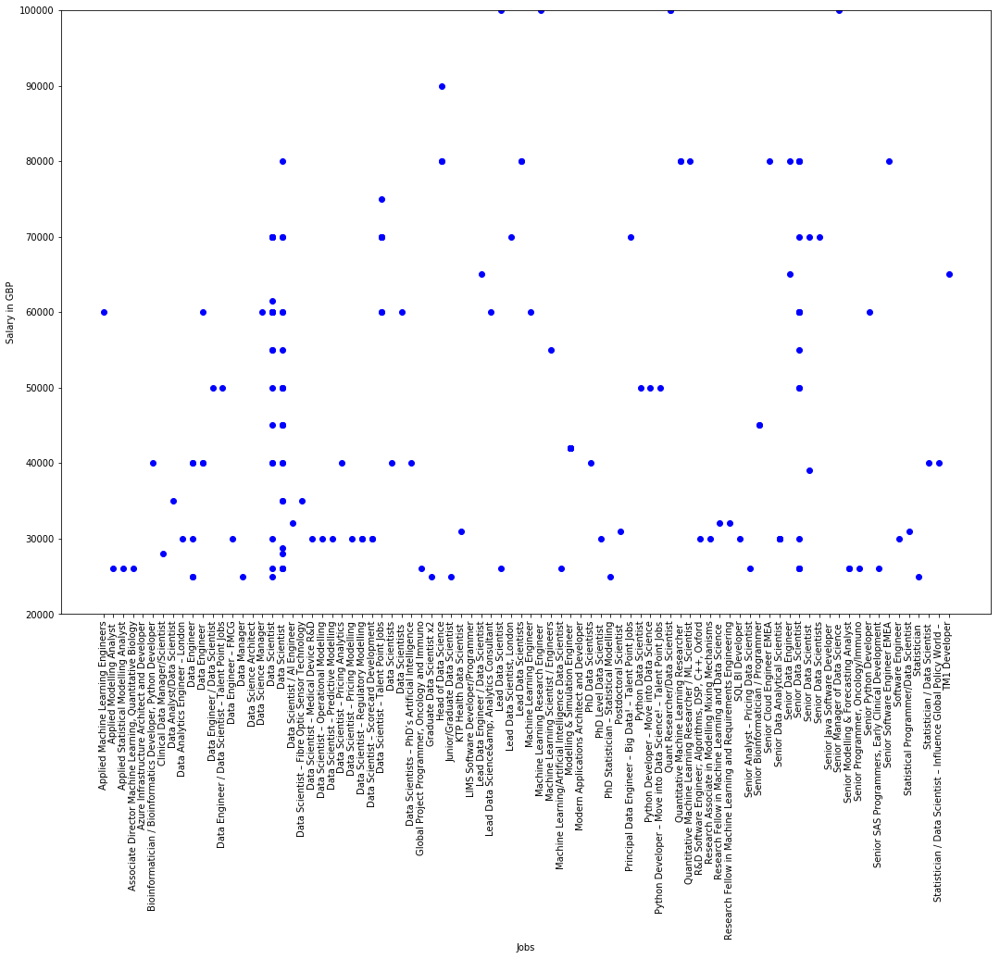

In [1019]:
# Plot scatter plots
import matplotlib
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(18,12))
# ax = fig.gca()

# ax.plot(df, job, lw=7., c='gold', alpha=0.5, label='true function')

# ax.set_xlabel('Job', fontsize=16)
# ax.set_ylabel('Salary', fontsize=16)
# ax.set_title('Job and salary\n', fontsize=20)
# plt.xlim(0, 10000)
plt.ylim(20000, 100000)
plt.xlabel(r'Jobs')
plt.ylabel(r'Salary in GBP')
plt.legend(loc='upper left')
# actual known points
plt.scatter(x = DSonly['Jobtitle1'] ,y=DSonly['Startsal2'],c='b')
plt.xticks(rotation=90)
plt.show()

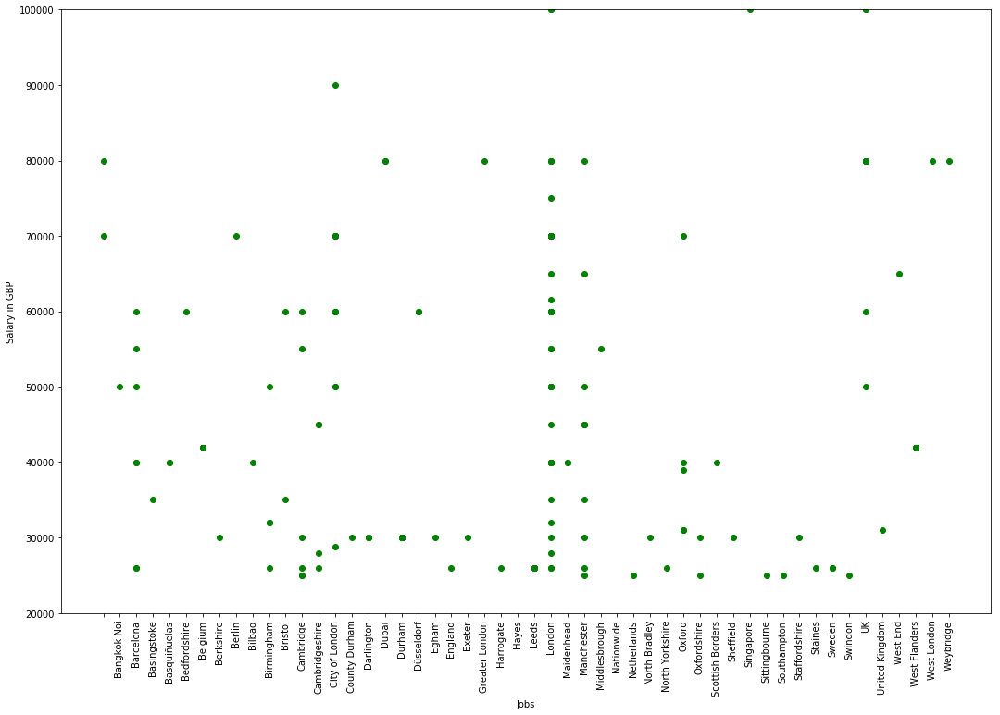

In [1020]:
# Plot scatter plots
import matplotlib
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(18,12))
ax = fig.gca()

# ax.plot(df, job, lw=7., c='gold', alpha=0.5, label='true function')

# ax.set_xlabel('Job', fontsize=16)
# ax.set_ylabel('Salary', fontsize=16)
# ax.set_title('Job and salary\n', fontsize=20)
plt.ylim(20000, 100000)
plt.xlabel(r'Jobs')
plt.ylabel(r'Salary in GBP')
plt.legend(loc='upper left')
# actual known points
plt.scatter(x = DSonly['city'] ,y=DSonly['Startsal2'],c='g')
# plt.scatter(x = DSonly['Short_job'] ,y=DSonly['Startsal2'],c='g')
plt.xticks(rotation=90)
plt.show()

In [597]:
pd.pivot_table(DSonly,index=["Short_job","city"])

,,Salaryband,Startsal1,Startsal2
Short_job,city,,,
Applied Machine Learning Engineers,Bristol,4.0,60.000000,60000.000000
Applied Modelling Analyst - SAS / R / Matlab - Lee,Leeds,1.0,26000.000000,26000.000000
Applied Statistical Modelling Analyst,Leeds,1.0,26000.000000,26000.000000
"Associate Director Machine Learning, Quantitative",Sweden,1.0,26000.000000,26000.000000
Azure Infrastructure Architect and Developer,Nationwide,4.0,500.000000,500000.000000
"Bioinformatician / Bioinformatics Developer, Pytho",Oxford,3.0,40000.000000,40000.000000
Clinical Data Manager/Scientist,Cambridgeshire,1.0,28.000000,28000.000000
Data Analyst/Data Scientist,London,3.0,35.000000,35000.000000
Data Analytics Engineer – London,London,2.0,30000.000000,30000.000000


In [ ]:
pd.pivot_table(DSonly,index=["city","job"])

In [648]:
DS_index = DSonly.set_index(['city','Short_job','Salaryband']).sort_index()

In [649]:
DS_index 

job_name  \
city             Short_job                                          Salaryband                                                      
                 Data Scientist                                     4                                              Data Scientist   
                 Senior Data Scientist                              4                                       Senior Data Scientist   
Bangkok Noi      Senior Data Scientist                              4                                       Senior Data Scientist   
Barcelona        Data Engineer                                      3                                               Data Engineer   
                                                                    3                                               Data Engineer   
                 Data Scientist                                     1                                              Data Scientist   
                 Data Scientist - Mobile Gaming                     1                              Data Scientist - Mobile Gaming   
                 Data Scientists - Barcelona                        4                                 Data Scientists - Barcelona   
                 Senior Data Scientist                              4                                       Senior Data Scientist   
                                                                    4                                       Senior Data Scientist   
Basingstoke      Data Scientist – Fibre Optic Sensor Technology     3              Data Scientist – Fibre Optic Sensor Technology   
Basquiñuelas     Data Scientists                                    3                                             Data Scientists   
                 Data Scientists – PhD’s Artificial Intelligence    3             Data Scientists – PhD’s Artificial Intelligence   
Bedfordshire     Lead Data Science&amp; Analytics Consultant        4                 Lead Data Science&amp; Analytics Consultant   
Belgium          Modelling & Simulation Engineer - Automotive Innov 4           Modelling & Simulation Engineer - Automotive I...   
                                                                    4           Modelling & Simulation Engineer - Automotive I...   
                                                                    4           Modelling & Simulation Engineer - Automotive I...   
                                                                    4           Modelling & Simulation Engineer - Automotive I...   
                                                                    4           Modelling & Simulation Engineer - Automotive I...   
                                                                    4           Modelling & Simulation Engineer - Automotive I...   
                                                                    4           Modelling & Simulation Engineer - Automotive I...   
                                                                    4           Modelling & Simulation Engineer - Automotive I...   
                                                                    4           Modelling & Simulation Engineer - Automotive I...   
                                                                    4           Modelling & Simulation Engineer - Automotive I...   
                                                                    4           Modelling & Simulation Engineer - Automotive I...   
                                                                    4           Modelling & Simulation Engineer - Automotive I...   
                                                                    4           Modelling & Simulation Engineer - Automotive I...   
                                                                    4           Modelling & Simulation Engineer - Automotive I...   
                                                                    4           Modelling & Simulation Engineer - Automotive I...  

In [650]:
DSonly.describe()

,Startsal1,Startsal2,Salaryband
count,416.000000,416.000000,416.000000
mean,35182.901442,52658.197115,3.608173
std,20006.635006,62433.050692,0.890556
min,25.000000,25000.000000,1.000000
25%,28062.500000,41970.000000,4.000000
50%,41970.000000,41970.000000,4.000000
75%,41970.000000,41970.000000,4.000000
max,100000.000000,600000.000000,4.000000


In [652]:
DSonly = DSonly.rename(columns={'DSjob1': 'Data_Scientist', 'DSjob2': 'Data_Science','DEjob': 'Data_engineer','DVjob': 'Developer'})

In [653]:
DSonly.head(4)

,job_name,location,salary,url,Desc,Startsal1,Startsal2,Short_job,Short_desc,job,city,Salaryband,Data_Scientist,Data_Science,Data_engineer,Developer,Jobtitle1,Jobtitle2
0,Data Scientist,"Manchester, United Kingdom","£30000 - £35000/annum bonus, benefits, progres...",https://www.mendeley.com/careers/job/2329996/d...,Best Recruit UK are partnering with on...,30000.0,30000.0,Data Scientist,Best Recruit UK are partnering with on...,Data Scientist,Manchester,2,DS1,,,,Data Scientist,None
1,Data Scientist,"London, London","£40,000 - £60,000 per annum",https://www.mendeley.com/careers/job/2522128/d...,An opportunity to join a machine learn...,40.0,40000.0,Data Scientist,An opportunity to join a machine learn...,Data Scientist,London,3,DS1,,,,Data Scientist,None
2,Data Scientist,"City of London, United Kingdom",£70000 - £80000/annum,https://www.mendeley.com/careers/job/2602075/d...,Are you a Data Scientist? Do you enjoy...,70000.0,70000.0,Data Scientist,Are you a Data Scientist? Do you enjoy...,Data Scientist,City of London,4,DS1,,,,Data Scientist,None
3,Data Scientist,"London, London","£50,000 - £60,000 per annum",https://www.mendeley.com/careers/job/2522063/d...,This is an excellent opportunity to jo...,50.0,50000.0,Data Scientist,This is an excellent opportunity to jo...,Data Scientist,London,4,DS1,,,,Data Scientist,None


In [ ]:
# extract words from column using a match
# yards = (x.split("for ")[-1]).split(" yards")[0]

In [655]:
DSonly['Salaryband'].value_counts()

4    339
1     29
2     28
3     20
Name: Salaryband, dtype: int64

In [656]:
DSonly.columns

Index([u'job_name', u'location', u'salary', u'url', u'Desc', u'Startsal1',
       u'Startsal2', u'Short_job', u'Short_desc', u'job', u'city',
       u'Salaryband', u'Data_Scientist', u'Data_Science', u'Data_engineer',
       u'Developer', u'Jobtitle1', u'Jobtitle2'],
      dtype='object')

In [657]:
# Backup dataset
DSonly2=DSonly

In [663]:
DSonly2.dtypes

job_name           object
location           object
salary             object
url                object
Desc               object
Startsal1         float64
Startsal2         float64
Short_job          object
Short_desc         object
job                object
city               object
Salaryband          int64
Data_Scientist     object
Data_Science       object
Data_engineer      object
Developer          object
Jobtitle1          object
Jobtitle2          object
dtype: object

In [668]:
DSonly2.columns

Index([u'job_name', u'location', u'salary', u'url', u'Desc', u'Startsal1',
       u'Startsal2', u'Short_job', u'Short_desc', u'job', u'city',
       u'Salaryband', u'Data_Scientist', u'Data_Science', u'Data_engineer',
       u'Developer', u'Jobtitle1', u'Jobtitle2'],
      dtype='object')

In [745]:
DSonlydata=DSonly2[['Startsal2','job', 'Short_desc','city','Salaryband', 'Data_Scientist', u'Data_Science', 'Data_engineer',
       'Developer', 'Jobtitle1']]
DSonlydata

,Startsal2,job,Short_desc,city,Salaryband,Data_Scientist,Data_Science,Data_engineer,Developer,Jobtitle1
0,30000.0,Data Scientist,Best Recruit UK are partnering with on...,Manchester,2,DS1,,,,Data Scientist
1,40000.0,Data Scientist,An opportunity to join a machine learn...,London,3,DS1,,,,Data Scientist
2,70000.0,Data Scientist,Are you a Data Scientist? Do you enjoy...,City of London,4,DS1,,,,Data Scientist
3,50000.0,Data Scientist,This is an excellent opportunity to jo...,London,4,DS1,,,,Data Scientist
4,60000.0,Data Scientist,Data Scientist - Up to 70k! Office ...,London,4,DS1,,,,Data Scientist
5,500000.0,Data Scientist,"As a Data Scientist, you will be joining a hi...",London,4,DS1,,,,Data Scientist
6,40000.0,Data Scientist,Data Scientist - Negotiable Salary - P...,Scottish Borders,3,DS1,,,,Data Scientist
7,70000.0,Data Scientist,Are you passionate about data science?...,City of London,4,DS1,,,,Data Scientist
8,50000.0,Data Engineer / Data Scientist,Data Engineer / Data Scientist Python...,City of London,4,DS1,,DE,,Data Engineer / Data Scientist
9,55000.0,Data Scientist,"COMPANY DESCRIPTION, PROFILE AND SCOPE...",Middlesbrough,4,DS1,,,,Data Scientist


In [746]:
DSonlydata['DStype'] = DSonlydata[['Data_Scientist','Data_Science','Data_engineer','Developer']].apply(lambda x: ''.join(x), axis=1)

C:\Users\bless\Anaconda2\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [747]:
DSonlydata

,Startsal2,job,Short_desc,city,Salaryband,Data_Scientist,Data_Science,Data_engineer,Developer,Jobtitle1,DStype
0,30000.0,Data Scientist,Best Recruit UK are partnering with on...,Manchester,2,DS1,,,,Data Scientist,DS1
1,40000.0,Data Scientist,An opportunity to join a machine learn...,London,3,DS1,,,,Data Scientist,DS1
2,70000.0,Data Scientist,Are you a Data Scientist? Do you enjoy...,City of London,4,DS1,,,,Data Scientist,DS1
3,50000.0,Data Scientist,This is an excellent opportunity to jo...,London,4,DS1,,,,Data Scientist,DS1
4,60000.0,Data Scientist,Data Scientist - Up to 70k! Office ...,London,4,DS1,,,,Data Scientist,DS1
5,500000.0,Data Scientist,"As a Data Scientist, you will be joining a hi...",London,4,DS1,,,,Data Scientist,DS1
6,40000.0,Data Scientist,Data Scientist - Negotiable Salary - P...,Scottish Borders,3,DS1,,,,Data Scientist,DS1
7,70000.0,Data Scientist,Are you passionate about data science?...,City of London,4,DS1,,,,Data Scientist,DS1
8,50000.0,Data Engineer / Data Scientist,Data Engineer / Data Scientist Python...,City of London,4,DS1,,DE,,Data Engineer / Data Scientist,DS1DE
9,55000.0,Data Scientist,"COMPANY DESCRIPTION, PROFILE AND SCOPE...",Middlesbrough,4,DS1,,,,Data Scientist,DS1


In [748]:
DSonlydata['DStype'].replace(['DS1DEV'],'DEV')


0          DS1
1          DS1
2          DS1
3          DS1
4          DS1
5          DS1
6          DS1
7          DS1
8        DS1DE
9          DS1
10         DS1
11         DS1
12         DS1
13         DS1
14         DS1
15         DS1
16         DS1
17         DS1
18         DS1
19         DS1
20         DS1
21         DS1
22         DS1
23         DS1
24         DS1
25         DS1
26         DS1
27         DS1
28         DS1
29         DS1
30         DS1
31         DS1
32         DS1
33         DS1
34         DS1
35       DS1DE
36         DS1
37         DS1
38         DS1
39         DS1
40         DS1
41         DS1
42         DS1
43         DS1
44         DS1
45         DS1
46         DS1
47         DS1
48         DS1
49         DS1
50         DS1
51         DS1
52         DS1
53         DS1
54         DS1
55         DS1
56         DS1
57         DS1
58         DS1
59         DS1
60         DS1
61         DS1
62         DS1
63         DS1
64         DS1
65         DS1
66        

In [749]:
DSonlydata['DStype']

0          DS1
1          DS1
2          DS1
3          DS1
4          DS1
5          DS1
6          DS1
7          DS1
8        DS1DE
9          DS1
10         DS1
11         DS1
12         DS1
13         DS1
14         DS1
15         DS1
16         DS1
17         DS1
18         DS1
19         DS1
20         DS1
21         DS1
22         DS1
23         DS1
24         DS1
25         DS1
26         DS1
27         DS1
28         DS1
29         DS1
30         DS1
31         DS1
32         DS1
33         DS1
34         DS1
35       DS1DE
36         DS1
37         DS1
38         DS1
39         DS1
40         DS1
41         DS1
42         DS1
43         DS1
44         DS1
45         DS1
46         DS1
47         DS1
48         DS1
49         DS1
50         DS1
51         DS1
52         DS1
53         DS1
54         DS1
55         DS1
56         DS1
57         DS1
58         DS1
59         DS1
60         DS1
61         DS1
62         DS1
63         DS1
64         DS1
65         DS1
66        

In [750]:
DSonlydata.describe(include='all')

,Startsal2,job,Short_desc,city,Salaryband,Data_Scientist,Data_Science,Data_engineer,Developer,Jobtitle1,DStype
count,416.000000,416,416,416,416.000000,416,416,416,416,416,416
unique,NaN,108,148,52,NaN,2,2,2,2,86,8
top,NaN,Modelling & Simulation Engineer - Innovate in ...,Modelling & Simulation Engineer - Auto...,West Flanders,NaN,DS1,,,,Modelling & Simulation Engineer,DS1
freq,NaN,186,248,186,NaN,376,405,396,399,248,372
mean,52658.197115,NaN,NaN,NaN,3.608173,NaN,NaN,NaN,NaN,NaN,NaN
std,62433.050692,NaN,NaN,NaN,0.890556,NaN,NaN,NaN,NaN,NaN,NaN
min,25000.000000,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN
25%,41970.000000,NaN,NaN,NaN,4.000000,NaN,NaN,NaN,NaN,NaN,NaN
50%,41970.000000,NaN,NaN,NaN,4.000000,NaN,NaN,NaN,NaN,NaN,NaN
75%,41970.000000,NaN,NaN,NaN,4.000000,NaN,NaN,NaN,NaN,NaN,NaN


In [751]:
DSfinal=DSonlydata

In [752]:
DSfinal.columns

Index([u'Startsal2', u'job', u'Short_desc', u'city', u'Salaryband',
       u'Data_Scientist', u'Data_Science', u'Data_engineer', u'Developer',
       u'Jobtitle1', u'DStype'],
      dtype='object')

In [753]:
DSfinal.drop(['Data_Scientist','Data_Science','Data_engineer','Developer'], axis=1, inplace=True)


C:\Users\bless\Anaconda2\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [268]:
# transform data using dummy variables 

# DSonly2 = pd.concat([DSonly2, pd.get_dummies(DSonly2['DSjobtype'],prefix='type_')], axis=1)

In [755]:
DSfinal.describe(include='all')

,Startsal2,job,Short_desc,city,Salaryband,Jobtitle1,DStype
count,416.000000,416,416,416,416.000000,416,416
unique,NaN,108,148,52,NaN,86,8
top,NaN,Modelling & Simulation Engineer - Innovate in ...,Modelling & Simulation Engineer - Auto...,West Flanders,NaN,Modelling & Simulation Engineer,DS1
freq,NaN,186,248,186,NaN,248,372
mean,52658.197115,NaN,NaN,NaN,3.608173,NaN,NaN
std,62433.050692,NaN,NaN,NaN,0.890556,NaN,NaN
min,25000.000000,NaN,NaN,NaN,1.000000,NaN,NaN
25%,41970.000000,NaN,NaN,NaN,4.000000,NaN,NaN
50%,41970.000000,NaN,NaN,NaN,4.000000,NaN,NaN
75%,41970.000000,NaN,NaN,NaN,4.000000,NaN,NaN


In [744]:
DSfinal.columns

Index([u'Startsal2', u'job', u'city', u'Salaryband', u'Jobtitle1', u'DStype'], dtype='object')

In [270]:
# DSonly2 = pd.concat([DSonly2, pd.get_dummies(DSonly2['city'],prefix='city_')], axis=1)

In [810]:
pd.pivot_table(DSfinal,index=["DStype","city"])

Salaryband      Startsal2
DStype city                                       
DE     Barcelona           3.000000   40000.000000
       Berkshire           2.000000   30000.000000
       Egham               2.000000   30000.000000
       London              3.666667   66666.666667
       Netherlands         1.000000   25000.000000
       North Bradley       2.000000   30000.000000
       Oxfordshire         2.000000   30000.000000
       Sittingbourne       1.000000   25000.000000
       West End            4.000000   65000.000000
DEV    Berkshire           4.000000  400000.000000
       Cambridge           4.000000   60000.000000
       Cambridgeshire      3.000000   38666.666667
       England             1.000000   26000.000000
       London              4.000000  600000.000000
       Manchester          4.000000   65000.000000
       Nationwide          4.000000  500000.000000
       Oxford              3.000000   40000.000000
       Staffordshire       2.000000   30000.000000
       Sweden              1.000000   26000.000000
DS1                        4.000000   75000.000000
       Bangkok Noi         4.000000   50000.000000
       Barcelona           2.800000   43400.000000
       Basingstoke         3.000000   35000.000000
       Basquiñuelas        3.000000   40000.000000
       Belgium             4.000000   41970.000000
       Berlin              4.000000   70000.000000
       Bilbao              3.000000   40000.000000
       Birmingham          2.250000   35000.000000
       Bristol             3.500000   47500.000000
       Cambridge           1.800000   32200.000000
       Cambridgeshire      1.000000   28000.000000
       City of London      3.625000   61093.750000
       County Durham       2.000000   30000.000000
       Darlington          2.000000   30000.000000
       Dubai               4.000000   80000.000000
       Durham              2.000000   30000.000000
       Düsseldorf          4.000000   60000.000000
       Exeter              2.000000   30000.000000
       Harrogate           1.000000   26000.000000
       Leeds               1.000000   26000.000000
       London              3.513514   66986.486486
       Manchester          3.000000   42333.333333
       Middlesbrough       4.000000   55000.000000
       North Yorkshire     1.000000   26000.000000
       Oxford              3.000000   46666.666667
       Oxfordshire         1.000000   25000.000000
       Scottish Borders    3.000000   40000.000000
       Sheffield           2.000000   30000.000000
       Singapore           4.000000  100000.000000
       Southampton         1.000000   25000.000000
       Staines             1.000000   26000.000000
       Sweden              1.000000   26000.000000
       Swindon             1.000000   25000.000000
       UK                  4.000000   78571.428571
       United Kingdom      2.000000   31000.000000
       West Flanders       4.000000   41970.000000
       West London         4.000000   80000.000000
       Weybridge           4.000000   80000.000000
DS1DE  City of London      4.000000   50000.000000
       London              4.000000   65000.000000
DS1DEV Oxford              2.000000   31000.000000
DS2    Bedfordshire        4.000000   60000.000000
       City of London      4.000000   90000.000000
       Greater London      4.000000   80000.000000
       Hayes               4.000000  500000.000000
       London              4.000000   80000.000000
       UK                  4.000000   80000.000000
DS2DE  Maidenhead          3.000000   40000.000000
DS2DEV London              4.000000   50000.000000

In [832]:
pd.pivot_table(DSfinal,index=["Modelling","city"])

Salaryband      Startsal2
Modelling city                                       
0         Belgium             4.000000   41970.000000
          Berkshire           4.000000  400000.000000
          Bristol             4.000000   60000.000000
          Cambridge           4.000000   60000.000000
          Cambridgeshire      3.000000   38666.666667
          England             1.000000   26000.000000
          Hayes               4.000000  500000.000000
          London              4.000000  340000.000000
          Manchester          4.000000   65000.000000
          Nationwide          4.000000  500000.000000
          North Bradley       2.000000   30000.000000
          Oxford              3.000000   40000.000000
          Sheffield           2.000000   30000.000000
          Staffordshire       2.000000   30000.000000
          Sweden              1.000000   26000.000000
          UK                  4.000000  100000.000000
          West Flanders       4.000000   41970.000000
                              4.000000   75000.000000
          Bangkok Noi         4.000000   50000.000000
          Barcelona           2.857143   42428.571429
          Basingstoke         3.000000   35000.000000
          Basquiñuelas        3.000000   40000.000000
          Bedfordshire        4.000000   60000.000000
          Berkshire           2.000000   30000.000000
          Berlin              4.000000   70000.000000
          Bilbao              3.000000   40000.000000
          Birmingham          2.500000   38000.000000
          Bristol             3.000000   35000.000000
          Cambridge           1.333333   26666.666667
          Cambridgeshire      1.000000   28000.000000
          City of London      3.700000   61875.000000
          County Durham       2.000000   30000.000000
          Darlington          2.000000   30000.000000
          Dubai               4.000000   80000.000000
          Durham              2.000000   30000.000000
          Düsseldorf          4.000000   60000.000000
          Egham               2.000000   30000.000000
          Exeter              2.000000   30000.000000
          Greater London      4.000000   80000.000000
          Harrogate           1.000000   26000.000000
          London              3.545455   66556.818182
          Maidenhead          3.000000   40000.000000
          Manchester          3.000000   42333.333333
          Middlesbrough       4.000000   55000.000000
          Netherlands         1.000000   25000.000000
          North Yorkshire     1.000000   26000.000000
          Oxford              3.000000   46666.666667
          Oxfordshire         1.500000   27500.000000
          Scottish Borders    3.000000   40000.000000
          Singapore           4.000000  100000.000000
          Sittingbourne       1.000000   25000.000000
          Southampton         1.000000   25000.000000
          Staines             1.000000   26000.000000
          UK                  4.000000   72500.000000
          United Kingdom      2.000000   31000.000000
          West End            4.000000   65000.000000
          Weybridge           4.000000   80000.000000
Modeling  Birmingham          2.000000   32000.000000
          Cambridge           2.500000   40500.000000
          City of London      4.000000   60000.000000
          Durham              2.000000   30000.000000
          Leeds               1.000000   26000.000000
          London              4.000000   57500.000000
          Oxford              2.000000   31000.000000
          Swindon             1.000000   25000.000000
          UK                  4.000000   80000.000000
          West London         4.000000   80000.000000

In [720]:
# DSonly2 = pd.concat([DSonly2, pd.get_dummies(DSonly2['Salaryband'],prefix='sal_')], axis=1)

In [607]:
import pandas as pd
import numpy as np
import scipy as sp
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from textblob import TextBlob, Word
from nltk.stem.snowball import SnowballStemmer
%matplotlib inline

In [769]:
# create a new DataFrame that only contains the salary  and job desc 

from collections import defaultdict

# define X and y
X = DSfinal['Short_desc']
y = DSfinal['Salaryband']

# # split the new DataFrame into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

In [757]:
# print len(X_train)
# # print len(X_test)

In [758]:
# rows are documents, columns are terms (aka "tokens" or "features")
# X_train_dtm.shape

In [611]:
# from textblob import TextBlob, Word
# from nltk.stem.snowball import SnowballStemmer

In [770]:
# Term Frequency-Inverse Document Frequency (TF-IDF)¶


# X_train_dtm = vect.fit_transform(X_train)
# X_train_dtm.shape
# Term Frequency
# create a document-term matrix using TF-IDF
vect = TfidfVectorizer(stop_words='english')
dtm = vect.fit_transform(X)
features = vect.get_feature_names()
dtm.shape

(416, 1295)

In [771]:
print features

[u'000', u'02210r', u'02258r', u'10', u'100', u'12', u'120', u'170', u'190', u'20', u'2019', u'25', u'28', u'30', u'30k', u'31', u'35', u'35k', u'38', u'39', u'3rd', u'40k', u'418', u'42', u'47', u'50', u'50k', u'60', u'604', u'60k', u'65', u'70', u'70k', u'722', u'75', u'80', u'80k', u'833', u'90', u'90k', u'992', u'ab', u'abili', u'ability', u'ac', u'accomplished', u'accurate', u'achieved', u'acquiring', u'acquisition', u'act', u'actionable', u'actions', u'activ', u'active', u'actively', u'activit', u'activitieskey', u'ad', u'add', u'address', u'addressing', u'adept', u'advanced', u'advancing', u'adverts', u'agencies', u'agency', u'agile', u'ago', u'ai', u'aim', u'aiming', u'aims', u'algorithm', u'algorithmic', u'algorithms', u'allow', u'allows', u'alongside', u'ambitious', u'amoun', u'amounts', u'amsterdam', u'analyse', u'analysing', u'analysis', u'analyst', u'analysts', u'analytic', u'analytical', u'analytics', u'analyze', u'android', u'angles', u'anomalies', u'ansible', u'app', u'

In [761]:
type(dtm)

scipy.sparse.csr.csr_matrix

In [772]:
print dtm

  (0, 165)	0.204989289419
  (0, 992)	0.190270134464
  (0, 1232)	0.15466416623
  (0, 865)	0.230151851014
  (0, 452)	0.141490006262
  (0, 941)	0.230151851014
  (0, 837)	0.196888753902
  (0, 251)	0.0545856151763
  (0, 1061)	0.162201870274
  (0, 315)	0.158922407425
  (0, 1047)	0.195252020556
  (0, 247)	0.184674171464
  (0, 949)	0.175550979509
  (0, 256)	0.162201870274
  (0, 401)	0.179826727824
  (0, 674)	0.162201870274
  (0, 956)	0.409978578838
  (0, 610)	0.215432696059
  (0, 753)	0.175550979509
  (0, 1079)	0.215432696059
  (0, 328)	0.196888753902
  (0, 682)	0.150388417915
  (0, 90)	0.179826727824
  (0, 791)	0.0533117334943
  (0, 944)	0.0540139198519
  :	:
  (414, 64)	0.189944063609
  (414, 324)	0.189944063609
  (415, 251)	0.188443168665
  (415, 791)	0.184045411127
  (415, 944)	0.186469533705
  (415, 1288)	0.347806883957
  (415, 617)	0.184045411127
  (415, 701)	0.181197033293
  (415, 420)	0.17658904253
  (415, 1290)	0.181667289866
  (415, 421)	0.186960036209
  (415, 1183)	0.185980943496
  

In [864]:
# create a DF based on the combined vectors outputs from the TFID vectorizer
dfjob=pd.DataFrame(data=dtm.todense(),columns=features)
dfjob.head(4)

,000,02210r,02258r,10,100,12,120,170,190,20,2019,25,28,30,30k,31,35,35k,38,39,3rd,40k,418,42,47,50,50k,60,604,60k,65,70,70k,722,75,80,80k,833,90,90k,992,ab,abili,ability,ac,accomplished,accurate,achieved,acquiring,acquisition,act,actionable,actions,activ,active,actively,activit,activitieskey,ad,add,address,addressing,adept,advanced,advancing,adverts,agencies,agency,agile,ago,ai,aim,aiming,aims,algorithm,algorithmic,algorithms,allow,allows,alongside,ambitious,amoun,amounts,amsterdam,analyse,analysing,analysis,analyst,analysts,analytic,analytical,analytics,analyze,android,angles,anomalies,ansible,app,application,applications,applied,apply,applying,appoint,appro,approach,approaches,appropriate,ar,architect,architecting,architectures,area,areas,arising,art,artificial,ask,aspiring,assessment,asset,associate,associated,assured,astrazeneca,astrazenecas,atlas,attendance,audience,automation,automotive,autonomy,available,avenues,awake,award,aws,awsthis,azure,bachelors,background,backing,balance,bank,banking,barbican,barcelona,based,basingstoke,basis,basque,baththe,bdi,bed,behavior,behavioral,behaviour,behavioural,believe,believes,ben,benefits,bens,berkshire,berlin,best,better,bi,big,biggest,bioinformatian,bioinformatician,bioinformatics,biologic,biology,biomedical,biometrics,biotechnology,boffins,bolster,bonus,books,boring,boundaries,brand,brands,brightest,bristol,broad,browse,bucks,budget,build,building,built,bureaucracy,busi,business,businesses,calibre,calling,cambridge,cambridgeshire,campaigns,candidate,candidates,cannock,capability,capture,care,career,carried,carry,carrying,case,cases,causes,cell,central,centre,challenge,challenges,challenging,championed,chance,change,channels,characterized,charge,chase,choose,city,ck,class,clich,cliché,client,clients,clinical,closely,cloud,clustering,code,coding,collaborative,collegiate,come,commercial,communications,community,commutable,companies,company,companya,companyexciting,comparable,competitive,compile,complex,complexity,compliance,comprises,computational,computer,concepts,conducting,connected,connection,consider,considered,constant,constantly,consultancy,consultant,consultants,consulting,consumer,cont,contains,content,continually,continue,continued,continuing,continuous,continuously,contribute,control,converge,conversion,corporate,correct,counties,countries,country,county,couple,cover,create,created,creating,creation,crime,critical,crm,curious,currently,customer,customers,cut,cutting,da,daily,darlington,dat,data,datacarry,day,deal,decision,decisions,declared,dedicated,deep,definitely,degree,deliver,delivering,delivery,demonstrate,departme,department,dependant,dependent,deploy,deploying,derive,describing,description,desig,design,designed,desirable,det,detailed,detect,develop,developed,developer,developers,developing,development,developments,develops,device,devices,devon,di,diagnostic,difference,different,digital,dimensional,dimensionality,direct,direction,director,disciplinary,discipline,discover,discovery,discretionary,discuss,disease,distilling,distribution,diverse,django,docker,doctoral,doe,doing,domain,draw,dri,drive,driven,drug,dubai,dur,duration,durham,duties,dynamic,dynamodb,düsseldorf,early,ease,ec2,eco,ecommerce,edge,education,efficient,egham,elasticities,electrification,embed,emea,employees,employer,en,enable,enables,enabling,encourages,end,energy,engagement,enginee,engineer,engineering,engineers,enhance,enjoy,enrich,enrichment,ensure,entail,enthusiastic,entrepreneurial,entry,enviable,environment,environmental,environmentyour,envision,epidemiol,epidemiology,especially,established,establishes,europe,evaluate,evolution,evolutionary,exa,example,excel,excellent,exceptional,excited,exciting,execute,executive,exeter,existing,exp,expanding,expansion,expectations,expensed,experie,experien,experience,experienced,experiences,experiencing,experiment,experimenting,experiments,expert,expertise,exploit,exploiting,exploratory,explore,exploring,extraordinary,fabric,facing,failing,fans,fantastic,f

In [972]:
# Sum up the TFID scores for all columns 
results=dfjob.agg(['sum', 'min'])
print results

          000    02210r    02258r        10       100        12       120  \
sum  2.078822  0.210816  0.212614  0.532371  0.740188  1.539876  0.147807   
min  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

          170       190        20     2019        25        28        30  \
sum  0.204962  0.881735  0.537957  0.18424  0.545564  0.198075  0.368863   
min  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000   

         30k        31        35       35k        38        39       3rd  \
sum  0.36979  0.338725  0.209493  0.517119  0.338725  0.189288  0.376598   
min  0.00000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

          40k       418        42        47       50       50k        60  \
sum  0.378956  0.193449  0.193449  0.189288  0.95413  0.172632  0.313053   
min  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   

          604       60k        65        70       70k       722        75  \
sum 

In [973]:
type(results)

pandas.core.frame.DataFrame

In [978]:
trans=results.T
trans

,sum,min
000,2.078822,0.0
02210r,0.210816,0.0
02258r,0.212614,0.0
10,0.532371,0.0
100,0.740188,0.0
12,1.539876,0.0
120,0.147807,0.0
170,0.204962,0.0
190,0.881735,0.0
20,0.537957,0.0


In [1014]:
type(trans)

pandas.core.frame.DataFrame

In [1016]:
# sortedval = trans.sort(['sum'], ascending=[False])
trans.sort_values(by=['sum', 'min'], ascending=[False, True])

# trans.sum.value_counts().reset_index().sort([0,'index'],ascending=[False,True])

,sum,min
automotive,94.212256,0.0
working,88.078087,0.0
advancing,47.106128,0.0
definitely,47.106128,0.0
electrification,47.106128,0.0
incredible,47.106128,0.0
nonstop,47.106128,0.0
pioneering,47.106128,0.0
simulation,47.106128,0.0
innovating,47.031651,0.0


In [983]:
cols=results.columns
vals=trans.columns
    
    
print vals

Index([u'sum', u'min'], dtype='object')


In [917]:
sorted(results, key=str, reverse=False)

[          000    02210r    02258r        10       100        12       120  \
 sum  2.078822  0.210816  0.212614  0.532371  0.740188  1.539876  0.147807   
 min  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
 
           170       190        20     2019        25        28        30  \
 sum  0.204962  0.881735  0.537957  0.18424  0.545564  0.198075  0.368863   
 min  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000  0.000000   
 
          30k        31        35       35k        38        39       3rd  \
 sum  0.36979  0.338725  0.209493  0.517119  0.338725  0.189288  0.376598   
 min  0.00000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
 
           40k       418        42        47       50       50k        60  \
 sum  0.378956  0.193449  0.193449  0.189288  0.95413  0.172632  0.313053   
 min  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   
 
           604       60k        65        70       70k       722 

In [865]:
dfjob.describe()

000      02210r      02258r          10         100          12  \
count  416.000000  416.000000  416.000000  416.000000  416.000000  416.000000   
mean     0.004997    0.000507    0.000511    0.001280    0.001779    0.003702   
std      0.044741    0.010336    0.010424    0.015062    0.018466    0.026474   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.692926    0.210816    0.212614    0.192149    0.219201    0.197367   

              120         170         190          20        2019          25  \
count  416.000000  416.000000  416.000000  416.000000  416.000000  416.000000   
mean     0.000355    0.000493    0.002120    0.001293    0.000443    0.001311   
std      0.007247    0.010049    0.021537    0.015459    0.009033    0.015427   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.147807    0.204962    0.221356    0.204377    0.184240    0.189369   

               28          30         30k          31          35         35k  \
count  416.000000  416.000000  416.000000  416.000000  416.000000  416.000000   
mean     0.000476    0.000887    0.000889    0.000814    0.000504    0.001243   
std      0.009711    0.012783    0.012834    0.011757    0.010271    0.014655   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.198075    0.191854    0.197333    0.181077    0.209493    0.189369   

               38          39         3rd         40k         418          42  \
count  416.000000  416.000000  416.000000  416.000000  416.000000  416.000000   
mean     0.000814    0.000455    0.000905    0.000911    0.000465    0.000465   
std      0.011757    0.009281    0.013040    0.013175    0.009485    0.009485   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.181077    0.189288    0.188299    0.206499    0.193449    0.193449   

               47          50         50k          60         604         60k  \
count  416.000000  416.000000  416.000000  416.000000  416.000000  416.000000   
mean     0.000455    0.002294    0.000415    0.000753    0.000814    0.000501   
std      0.009281    0.020844    0.008464    0.010913    0.011757    0.010220   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.189288    0.197086    0.172632    0.174698    0.181077    0.208449   

               65          70         70k         722          75          80  \
count  416.000000  416.000000  416.000000  416.000000  416.000000  416.000000   
mean     0.000355    0.000491    0.000887    0.000455    0.000449    0.003349   
std      0.007247    0.010006    0.012824    0.009281    0.009151    0.024277   
min      0.000000    0.000000    0.00000

In [866]:
DSsalband = DSfinal[['Salaryband']]
DSsalband.describe()

,Salaryband
count,416.000000
mean,3.608173
std,0.890556
min,1.000000
25%,4.000000
50%,4.000000
75%,4.000000
max,4.000000


In [870]:

totaljob = pd.concat([dfjob, DSsalband], axis=1)
# # combine DF from vectoriser and Salaryband ie X and Y 
# dfjobcomb=dfjob.append(DSsalband)

# dfjobcomb.describe(include='all')

In [871]:
totaljob.describe()

000      02210r      02258r          10         100          12  \
count  416.000000  416.000000  416.000000  416.000000  416.000000  416.000000   
mean     0.004997    0.000507    0.000511    0.001280    0.001779    0.003702   
std      0.044741    0.010336    0.010424    0.015062    0.018466    0.026474   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.692926    0.210816    0.212614    0.192149    0.219201    0.197367   

              120         170         190          20        2019          25  \
count  416.000000  416.000000  416.000000  416.000000  416.000000  416.000000   
mean     0.000355    0.000493    0.002120    0.001293    0.000443    0.001311   
std      0.007247    0.010049    0.021537    0.015459    0.009033    0.015427   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.147807    0.204962    0.221356    0.204377    0.184240    0.189369   

               28          30         30k          31          35         35k  \
count  416.000000  416.000000  416.000000  416.000000  416.000000  416.000000   
mean     0.000476    0.000887    0.000889    0.000814    0.000504    0.001243   
std      0.009711    0.012783    0.012834    0.011757    0.010271    0.014655   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.198075    0.191854    0.197333    0.181077    0.209493    0.189369   

               38          39         3rd         40k         418          42  \
count  416.000000  416.000000  416.000000  416.000000  416.000000  416.000000   
mean     0.000814    0.000455    0.000905    0.000911    0.000465    0.000465   
std      0.011757    0.009281    0.013040    0.013175    0.009485    0.009485   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.181077    0.189288    0.188299    0.206499    0.193449    0.193449   

               47          50         50k          60         604         60k  \
count  416.000000  416.000000  416.000000  416.000000  416.000000  416.000000   
mean     0.000455    0.002294    0.000415    0.000753    0.000814    0.000501   
std      0.009281    0.020844    0.008464    0.010913    0.011757    0.010220   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.189288    0.197086    0.172632    0.174698    0.181077    0.208449   

               65          70         70k         722          75          80  \
count  416.000000  416.000000  416.000000  416.000000  416.000000  416.000000   
mean     0.000355    0.000491    0.000887    0.000455    0.000449    0.003349   
std      0.007247    0.010006    0.012824    0.009281    0.009151    0.024277   
min      0.000000    0.000000    0.00000

In [872]:
totaljob['Salaryband']

0       2.0
1       3.0
2       4.0
3       4.0
4       4.0
5       4.0
6       3.0
7       4.0
8       4.0
9       4.0
10      1.0
11      4.0
12      4.0
13      4.0
14      4.0
15      4.0
16      3.0
17      4.0
18      4.0
19      1.0
20      1.0
21      2.0
22      4.0
23      2.0
24      2.0
25      1.0
26      4.0
27      4.0
28      2.0
29      2.0
30      2.0
31      2.0
32      2.0
33      2.0
34      2.0
35      4.0
36      4.0
37      4.0
38      1.0
39      4.0
40      4.0
41      2.0
42      4.0
43      4.0
44      4.0
45      1.0
46      2.0
47      2.0
48      1.0
49      4.0
50      4.0
51      4.0
52      4.0
53      2.0
54      4.0
55      3.0
56      4.0
57      4.0
58      4.0
59      3.0
60      4.0
61      4.0
62      4.0
63      4.0
64      4.0
65      4.0
66      4.0
67      3.0
68      4.0
69      4.0
70      4.0
71      3.0
72      1.0
73      4.0
74      1.0
75      NaN
76      3.0
77      1.0
78      4.0
79      4.0
80      4.0
81      1.0
82      NaN
83  

In [918]:
DSfinal.columns

Index([u'Startsal2', u'job', u'Short_desc', u'city', u'Salaryband',
       u'Jobtitle1', u'DStype', u'Senior', u'Modelling'],
      dtype='object')

In [1026]:
DSfinal['Senior'].describe()

count     416
unique      3
top         0
freq      270
Name: Senior, dtype: int64

In [1078]:
from sklearn.model_selection import train_test_split
# split data into Train and Test for  X and y
X = dfjob
y = DSfinal['Salaryband']
z = DSfinal['DStype']
w = DSfinal['Senior']
v=  DSfinal['Modelling']
u=  DSfinal['DVjob']
# print X, y,z,w

# split the new DataFrame into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

X2_train, X2_test, y2_train, y2_test = train_test_split(X, z, random_state=1)

X3_train, X3_test, y3_train, y3_test = train_test_split(X, w, random_state=1)

X4_train, X4_test, y4_train, y4_test = train_test_split(X, v, random_state=1)

X5_train, X5_test, y5_train, y5_test = train_test_split(X, u, random_state=1)

In [1071]:
X_train.describe()

000      02210r      02258r          10         100          12  \
count  312.000000  312.000000  312.000000  312.000000  312.000000  312.000000   
mean     0.005641    0.000676    0.000681    0.001090    0.001670    0.003676   
std      0.048431    0.011935    0.012037    0.013601    0.017377    0.026298   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.692926    0.210816    0.212614    0.173992    0.219201    0.197367   

              120         170         190          20        2019          25  \
count  312.000000  312.000000  312.000000  312.000000  312.000000  312.000000   
mean     0.000474    0.000657    0.001413    0.001724    0.000591    0.001749   
std      0.008368    0.011604    0.017621    0.017837    0.010431    0.017799   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.147807    0.204962    0.221356    0.204377    0.184240    0.189369   

          28          30         30k          31          35         35k  \
count  312.0  312.000000  312.000000  312.000000  312.000000  312.000000   
mean     0.0    0.001182    0.001185    0.001086    0.000671    0.001657   
std      0.0    0.014755    0.014813    0.013571    0.011860    0.016909   
min      0.0    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.0    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.0    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.0    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.0    0.191854    0.197333    0.181077    0.209493    0.189369   

               38          39         3rd         40k         418          42  \
count  312.000000  312.000000  312.000000  312.000000  312.000000  312.000000   
mean     0.001086    0.000607    0.001207    0.000553    0.000620    0.000620   
std      0.013571    0.010716    0.015052    0.009763    0.010952    0.010952   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.181077    0.189288    0.188299    0.172457    0.193449    0.193449   

               47          50         50k          60         604         60k  \
count  312.000000  312.000000  312.000000  312.000000  312.000000  312.000000   
mean     0.000607    0.002426    0.000553    0.001003    0.001086    0.000668   
std      0.010716    0.021355    0.009773    0.012597    0.013571    0.011801   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
75%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
max      0.189288    0.197086    0.172632    0.174698    0.181077    0.208449   

               65     70    70k         722          75          80  \
count  312.000000  312.0  312.0  312.000000  312.000000  312.000000   
mean     0.000474    0.0    0.0    0.000607    0.000598    0.002707   
std      0.008368    0.0    0.0    0.010716    0.010566    0.021627   
min      0.000000    0.0    0.0    0.000000    0.000000    0.000000   
25%      0.000000    0.0    0.0    0.000000    0.00000

In [1072]:
X_test.describe()

,000,02210r,02258r,10,100,12,120,170,190,20,2019,25,28,30,30k,31,35,35k,38,39,3rd,40k,418,42,47,50,50k,60,604,60k,65,70,70k,722,75,80,80k,833,90,90k,992,ab,abili,ability,ac,accomplished,accurate,achieved,acquiring,acquisition,act,actionable,actions,activ,active,actively,activit,activitieskey,ad,add,address,addressing,adept,advanced,advancing,adverts,agencies,agency,agile,ago,ai,aim,aiming,aims,algorithm,algorithmic,algorithms,allow,allows,alongside,ambitious,amoun,amounts,amsterdam,analyse,analysing,analysis,analyst,analysts,analytic,analytical,analytics,analyze,android,angles,anomalies,ansible,app,application,applications,applied,apply,applying,appoint,appro,approach,approaches,appropriate,ar,architect,architecting,architectures,area,areas,arising,art,artificial,ask,aspiring,assessment,asset,associate,associated,assured,astrazeneca,astrazenecas,atlas,attendance,audience,automation,automotive,autonomy,available,avenues,awake,award,aws,awsthis,azure,bachelors,background,backing,balance,bank,banking,barbican,barcelona,based,basingstoke,basis,basque,baththe,bdi,bed,behavior,behavioral,behaviour,behavioural,believe,believes,ben,benefits,bens,berkshire,berlin,best,better,bi,big,biggest,bioinformatian,bioinformatician,bioinformatics,biologic,biology,biomedical,biometrics,biotechnology,boffins,bolster,bonus,books,boring,boundaries,brand,brands,brightest,bristol,broad,browse,bucks,budget,build,building,built,bureaucracy,busi,business,businesses,calibre,calling,cambridge,cambridgeshire,campaigns,candidate,candidates,cannock,capability,capture,care,career,carried,carry,carrying,case,cases,causes,cell,central,centre,challenge,challenges,challenging,championed,chance,change,channels,characterized,charge,chase,choose,city,ck,class,clich,cliché,client,clients,clinical,closely,cloud,clustering,code,coding,collaborative,collegiate,come,commercial,communications,community,commutable,companies,company,companya,companyexciting,comparable,competitive,compile,complex,complexity,compliance,comprises,computational,computer,concepts,conducting,connected,connection,consider,considered,constant,constantly,consultancy,consultant,consultants,consulting,consumer,cont,contains,content,continually,continue,continued,continuing,continuous,continuously,contribute,control,converge,conversion,corporate,correct,counties,countries,country,county,couple,cover,create,created,creating,creation,crime,critical,crm,curious,currently,customer,customers,cut,cutting,da,daily,darlington,dat,data,datacarry,day,deal,decision,decisions,declared,dedicated,deep,definitely,degree,deliver,delivering,delivery,demonstrate,departme,department,dependant,dependent,deploy,deploying,derive,describing,description,desig,design,designed,desirable,det,detailed,detect,develop,developed,developer,developers,developing,development,developments,develops,device,devices,devon,di,diagnostic,difference,different,digital,dimensional,dimensionality,direct,direction,director,disciplinary,discipline,discover,discovery,discretionary,discuss,disease,distilling,distribution,diverse,django,docker,doctoral,doe,doing,domain,draw,dri,drive,driven,drug,dubai,dur,duration,durham,duties,dynamic,dynamodb,düsseldorf,early,ease,ec2,eco,ecommerce,edge,education,efficient,egham,elasticities,electrification,embed,emea,employees,employer,en,enable,enables,enabling,encourages,end,energy,engagement,enginee,engineer,engineering,engineers,enhance,enjoy,enrich,enrichment,ensure,entail,enthusiastic,entrepreneurial,entry,enviable,environment,environmental,environmentyour,envision,epidemiol,epidemiology,especially,established,establishes,europe,evaluate,evolution,evolutionary,exa,example,excel,excellent,exceptional,excited,exciting,execute,executive,exeter,existing,exp,expanding,expansion,expectations,expensed,experie,experien,experience,experienced,experiences,experiencing,experiment,experimenting,experiments,expert,expertise,exploit,exploiting,exploratory,explore,exploring,extraordinary,fabric,facing,failing,fans,fantastic,f

In [885]:
# Run Multinomial  Logit regression to check if job desc terms can be used to predict salary bands 
# does salaryband have a impact on Jobs?
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split


model=LogisticRegression(multi_class='multinomial',solver ='newton-cg').fit(X_train,y_train)
# print model.summary()
preds = model.predict(X_test)  # will output array with integer values.

print preds

[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 2 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 1 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4]


In [886]:
model.coef_

array([[-0.10528473,  0.12077225,  0.12062199, ..., -0.02702331,
        -0.04171203,  0.0605531 ],
       [-0.15916228, -0.02629778, -0.02660199, ..., -0.01960775,
        -0.03678228, -0.06730741],
       [ 0.12097782, -0.02053645, -0.02067982, ..., -0.01695086,
        -0.02833371, -0.05664427],
       [ 0.1434692 , -0.07393802, -0.07334018, ...,  0.06358192,
         0.10682802,  0.06339858]])

In [887]:
model.score

<bound method LogisticRegression.score of LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='multinomial',
          n_jobs=1, penalty='l2', random_state=None, solver='newton-cg',
          tol=0.0001, verbose=0, warm_start=False)>

In [1025]:
# Run Multinomial  Logit regression to check if job desc terms cna be used to predict salary bands 
# does DS job type have a impact on Jobs?
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split


model=LogisticRegression(multi_class='multinomial',solver ='newton-cg').fit(X2_train,y2_train)
# print model.summary()
preds = model.predict(X2_test)  # will output array with integer values.

print preds

['DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1'
 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1'
 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1'
 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1'
 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1'
 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1'
 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1'
 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1'
 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1' 'DS1']


In [1073]:
# Run Multinomial  Logit regression to check if job desc terms can be used to predict salary bands 
# Does  Senior have a higher impact on salary?

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

model=LogisticRegression(multi_class='multinomial',solver ='newton-cg').fit(X3_train,y3_train)
# print model.summary()
preds = model.predict(X3_test)  # will output array with integer values.

print preds

['' '' '' '' '' '' '' '' '' '' '' '' '' '' 'Senior' '' '' '' '' '' '' '' ''
 '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' ''
 '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' ''
 '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' 'Senior' ''
 '' '' '' '' '' '' '' '']


In [1079]:
# Run Multinomial  Logit regression to check if job desc terms can be used to predict salary bands 
# Does Modelling have a higher impact on salary?

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

model=LogisticRegression(multi_class='multinomial',solver ='newton-cg').fit(X4_train,y4_train)
# print model.summary()
preds = model.predict(X4_test)  # will output array with integer values.

print preds

['Modelling' '' 'Modelling' 'Modelling' '' '' 'Modelling' 'Modelling' '' ''
 'Modelling' '' 'Modelling' 'Modelling' '' 'Modelling' 'Modelling' '' ''
 'Modelling' 'Modelling' '' 'Modelling' 'Modelling' '' 'Modelling' '' '' ''
 'Modelling' 'Modelling' 'Modelling' '' 'Modelling' '' '' '' '' 'Modelling'
 'Modelling' '' '' 'Modelling' 'Modelling' 'Modelling' 'Modelling'
 'Modelling' 'Modelling' 'Modelling' 'Modelling' 'Modelling' '' 'Modelling'
 'Modelling' '' 'Modelling' 'Modelling' 'Modelling' 'Modelling' ''
 'Modelling' '' 'Modelling' 'Modelling' 'Modelling' 'Modelling' 'Modelling'
 '' '' 'Modelling' 'Modelling' 'Modelling' '' 'Modelling' 'Modelling'
 'Modelling' 'Modelling' 'Modelling' 'Modelling' '' 'Modelling' ''
 'Modelling' 'Modelling' '' '' 'Modelling' 'Modelling' 'Modelling' ''
 'Modelling' 'Modelling' 'Modelling' '' '' 'Modelling' '' 'Modelling' '' ''
 'Modelling' '' 'Modelling' 'Modelling']


In [1080]:
# Run Multinomial  Logit regression to check if job desc terms can be used to predict salary bands 
# Does Developer jobs have a higher impact on salary?

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

model=LogisticRegression(multi_class='multinomial',solver ='newton-cg').fit(X5_train,y5_train)
# print model.summary()
preds = model.predict(X5_test)  # will output array with integer values.

print preds

['' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' ''
 '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' ''
 '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' ''
 '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' ''
 '' '' '' '']


In [843]:
TM.columns

Index([u'Startsal2', u'job', u'Short_desc', u'city', u'Salaryband',
       u'Jobtitle1', u'DStype', u'Senior', u'Modelling', u'sal__1', u'sal__2',
       u'sal__3', u'sal__4'],
      dtype='object')

In [851]:
y1 = y[['Salaryband_2','Salaryband_3', 'Salaryband_3']].values

In [640]:
TM.describe()

,Startsal1,Startsal2,Salaryband,sal__1,sal__2,sal__3,sal__4
count,416.000000,416.000000,416.000000,416.000000,416.000000,416.000000,416.000000
mean,35182.901442,52658.197115,3.608173,0.069712,0.067308,0.048077,0.814904
std,20006.635006,62433.050692,0.890556,0.254967,0.250856,0.214186,0.388843
min,25.000000,25000.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,28062.500000,41970.000000,4.000000,0.000000,0.000000,0.000000,1.000000
50%,41970.000000,41970.000000,4.000000,0.000000,0.000000,0.000000,1.000000
75%,41970.000000,41970.000000,4.000000,0.000000,0.000000,0.000000,1.000000
max,100000.000000,600000.000000,4.000000,1.000000,1.000000,1.000000,1.000000


In [915]:
dfjob.head(3)

,000,02210r,02258r,10,100,12,120,170,190,20,2019,25,28,30,30k,31,35,35k,38,39,3rd,40k,418,42,47,50,50k,60,604,60k,65,70,70k,722,75,80,80k,833,90,90k,992,ab,abili,ability,ac,accomplished,accurate,achieved,acquiring,acquisition,act,actionable,actions,activ,active,actively,activit,activitieskey,ad,add,address,addressing,adept,advanced,advancing,adverts,agencies,agency,agile,ago,ai,aim,aiming,aims,algorithm,algorithmic,algorithms,allow,allows,alongside,ambitious,amoun,amounts,amsterdam,analyse,analysing,analysis,analyst,analysts,analytic,analytical,analytics,analyze,android,angles,anomalies,ansible,app,application,applications,applied,apply,applying,appoint,appro,approach,approaches,appropriate,ar,architect,architecting,architectures,area,areas,arising,art,artificial,ask,aspiring,assessment,asset,associate,associated,assured,astrazeneca,astrazenecas,atlas,attendance,audience,automation,automotive,autonomy,available,avenues,awake,award,aws,awsthis,azure,bachelors,background,backing,balance,bank,banking,barbican,barcelona,based,basingstoke,basis,basque,baththe,bdi,bed,behavior,behavioral,behaviour,behavioural,believe,believes,ben,benefits,bens,berkshire,berlin,best,better,bi,big,biggest,bioinformatian,bioinformatician,bioinformatics,biologic,biology,biomedical,biometrics,biotechnology,boffins,bolster,bonus,books,boring,boundaries,brand,brands,brightest,bristol,broad,browse,bucks,budget,build,building,built,bureaucracy,busi,business,businesses,calibre,calling,cambridge,cambridgeshire,campaigns,candidate,candidates,cannock,capability,capture,care,career,carried,carry,carrying,case,cases,causes,cell,central,centre,challenge,challenges,challenging,championed,chance,change,channels,characterized,charge,chase,choose,city,ck,class,clich,cliché,client,clients,clinical,closely,cloud,clustering,code,coding,collaborative,collegiate,come,commercial,communications,community,commutable,companies,company,companya,companyexciting,comparable,competitive,compile,complex,complexity,compliance,comprises,computational,computer,concepts,conducting,connected,connection,consider,considered,constant,constantly,consultancy,consultant,consultants,consulting,consumer,cont,contains,content,continually,continue,continued,continuing,continuous,continuously,contribute,control,converge,conversion,corporate,correct,counties,countries,country,county,couple,cover,create,created,creating,creation,crime,critical,crm,curious,currently,customer,customers,cut,cutting,da,daily,darlington,dat,data,datacarry,day,deal,decision,decisions,declared,dedicated,deep,definitely,degree,deliver,delivering,delivery,demonstrate,departme,department,dependant,dependent,deploy,deploying,derive,describing,description,desig,design,designed,desirable,det,detailed,detect,develop,developed,developer,developers,developing,development,developments,develops,device,devices,devon,di,diagnostic,difference,different,digital,dimensional,dimensionality,direct,direction,director,disciplinary,discipline,discover,discovery,discretionary,discuss,disease,distilling,distribution,diverse,django,docker,doctoral,doe,doing,domain,draw,dri,drive,driven,drug,dubai,dur,duration,durham,duties,dynamic,dynamodb,düsseldorf,early,ease,ec2,eco,ecommerce,edge,education,efficient,egham,elasticities,electrification,embed,emea,employees,employer,en,enable,enables,enabling,encourages,end,energy,engagement,enginee,engineer,engineering,engineers,enhance,enjoy,enrich,enrichment,ensure,entail,enthusiastic,entrepreneurial,entry,enviable,environment,environmental,environmentyour,envision,epidemiol,epidemiology,especially,established,establishes,europe,evaluate,evolution,evolutionary,exa,example,excel,excellent,exceptional,excited,exciting,execute,executive,exeter,existing,exp,expanding,expansion,expectations,expensed,experie,experien,experience,experienced,experiences,experiencing,experiment,experimenting,experiments,expert,expertise,exploit,exploiting,exploratory,explore,exploring,extraordinary,fabric,facing,failing,fans,fantastic,f

In [814]:
DSfinal

,Startsal2,job,Short_desc,city,Salaryband,Jobtitle1,DStype
0,30000.0,Data Scientist,Best Recruit UK are partnering with on...,Manchester,2,Data Scientist,DS1
1,40000.0,Data Scientist,An opportunity to join a machine learn...,London,3,Data Scientist,DS1
2,70000.0,Data Scientist,Are you a Data Scientist? Do you enjoy...,City of London,4,Data Scientist,DS1
3,50000.0,Data Scientist,This is an excellent opportunity to jo...,London,4,Data Scientist,DS1
4,60000.0,Data Scientist,Data Scientist - Up to 70k! Office ...,London,4,Data Scientist,DS1
5,500000.0,Data Scientist,"As a Data Scientist, you will be joining a hi...",London,4,Data Scientist,DS1
6,40000.0,Data Scientist,Data Scientist - Negotiable Salary - P...,Scottish Borders,3,Data Scientist,DS1
7,70000.0,Data Scientist,Are you passionate about data science?...,City of London,4,Data Scientist,DS1
8,50000.0,Data Engineer / Data Scientist,Data Engineer / Data Scientist Python...,City of London,4,Data Engineer / Data Scientist,DS1DE
9,55000.0,Data Scientist,"COMPANY DESCRIPTION, PROFILE AND SCOPE...",Middlesbrough,4,Data Scientist,DS1


In [1045]:
DSfinal.loc[DSfinal.job.str.contains('Senior') | DSfinal.job.str.contains('Manager') | DSfinal.job.str.contains('Head') 
, 'Senior'] = "Senior" 



In [1051]:
DSfinal.loc[DSfinal.job.str.contains('Model') |  DSfinal.job.str.contains('NLP') | DSfinal.job.str.contains('Machine Learn') | DSfinal.job.str.contains('Simulation') | 
DSfinal.job.str.contains('Neural') | DSfinal.job.str.contains('Neural') , 'Modelling'] = "Modelling" 



In [1055]:
DSfinal.loc[DSfinal.job.str.contains('Developer') |  DSfinal.job.str.contains('Programmer') | DSfinal.job.str.contains('Neural')   , 'DVjob'] = "Developer" 


In [1059]:
DSfinal['Senior'].fillna(0, inplace=True)
DSfinal['Modelling'].fillna(0, inplace=True)
DSfinal['DVjob'].fillna(0, inplace=True)

In [1074]:

DSfinal['Senior'] = DSfinal.Senior.astype(str)
DSfinal['Senior'].replace(['0', '0.0'], '', inplace=True)

DSfinal['Modelling'] = DSfinal.Modelling.astype(str)
DSfinal['Modelling'].replace(['0', '0.0'], '', inplace=True)

DSfinal['DVjob'] = DSfinal.DVjob.astype(str)
DSfinal['DVjob'].replace(['0', '0.0'], '', inplace=True)

C:\Users\bless\Anaconda2\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\bless\Anaconda2\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
C:\Users\bless\Anaconda2\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#

In [1076]:
DSfinal[['DVjob','job']]

,DVjob,job
0,,Data Scientist
1,,Data Scientist
2,,Data Scientist
3,,Data Scientist
4,,Data Scientist
5,,Data Scientist
6,,Data Scientist
7,,Data Scientist
8,,Data Engineer / Data Scientist
9,,Data Scientist


In [818]:
DSfinal.fillna(0, inplace=True)

C:\Users\bless\Anaconda2\lib\site-packages\pandas\core\frame.py:2754: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


In [829]:
DSfinal.columns

Index([u'Startsal2', u'job', u'Short_desc', u'city', u'Salaryband',
       u'Jobtitle1', u'DStype', u'Senior', u'Modelling'],
      dtype='object')

In [830]:
pd.pivot_table(DSfinal,index=["Modelling","city"])


df = df.reindex(df_pivot['Value'].sort_values(by=2012, ascending=False).index)


Salaryband      Startsal2
Modelling city                                       
0         Belgium             4.000000   41970.000000
          Berkshire           4.000000  400000.000000
          Bristol             4.000000   60000.000000
          Cambridge           4.000000   60000.000000
          Cambridgeshire      3.000000   38666.666667
          England             1.000000   26000.000000
          Hayes               4.000000  500000.000000
          London              4.000000  340000.000000
          Manchester          4.000000   65000.000000
          Nationwide          4.000000  500000.000000
          North Bradley       2.000000   30000.000000
          Oxford              3.000000   40000.000000
          Sheffield           2.000000   30000.000000
          Staffordshire       2.000000   30000.000000
          Sweden              1.000000   26000.000000
          UK                  4.000000  100000.000000
          West Flanders       4.000000   41970.000000
                              4.000000   75000.000000
          Bangkok Noi         4.000000   50000.000000
          Barcelona           2.857143   42428.571429
          Basingstoke         3.000000   35000.000000
          Basquiñuelas        3.000000   40000.000000
          Bedfordshire        4.000000   60000.000000
          Berkshire           2.000000   30000.000000
          Berlin              4.000000   70000.000000
          Bilbao              3.000000   40000.000000
          Birmingham          2.500000   38000.000000
          Bristol             3.000000   35000.000000
          Cambridge           1.333333   26666.666667
          Cambridgeshire      1.000000   28000.000000
          City of London      3.700000   61875.000000
          County Durham       2.000000   30000.000000
          Darlington          2.000000   30000.000000
          Dubai               4.000000   80000.000000
          Durham              2.000000   30000.000000
          Düsseldorf          4.000000   60000.000000
          Egham               2.000000   30000.000000
          Exeter              2.000000   30000.000000
          Greater London      4.000000   80000.000000
          Harrogate           1.000000   26000.000000
          London              3.545455   66556.818182
          Maidenhead          3.000000   40000.000000
          Manchester          3.000000   42333.333333
          Middlesbrough       4.000000   55000.000000
          Netherlands         1.000000   25000.000000
          North Yorkshire     1.000000   26000.000000
          Oxford              3.000000   46666.666667
          Oxfordshire         1.500000   27500.000000
          Scottish Borders    3.000000   40000.000000
          Singapore           4.000000  100000.000000
          Sittingbourne       1.000000   25000.000000
          Southampton         1.000000   25000.000000
          Staines             1.000000   26000.000000
          UK                  4.000000   72500.000000
          United Kingdom      2.000000   31000.000000
          West End            4.000000   65000.000000
          Weybridge           4.000000   80000.000000
Modeling  Birmingham          2.000000   32000.000000
          Cambridge           2.500000   40500.000000
          City of London      4.000000   60000.000000
          Durham              2.000000   30000.000000
          Leeds               1.000000   26000.000000
          London              4.000000   57500.000000
          Oxford              2.000000   31000.000000
          Swindon             1.000000   25000.000000
          UK                  4.000000   80000.000000
          West London         4.000000   80000.000000